# Author: Venkat Jagadeesh Jampani
Class: DSC540-T301 : Data Preparation
Date: Aug 13, 2022

# Project Milestone 5
## Merging the Data and Storing in a Database/Visualizing Data

### Steps to be followed:

1. Load flat file/webscrapped/API data to Database
2. load each dataset into SQL Lite as an individual table and then you must join the datasets together in Python into 1 dataset
3. Once all the data is merged together in your database, create 5 visualizations that demonstrate the data you have cleansed. 4. You should have at least 2 visualizations that have data from more than one source (meaning, if you have 3 tables, you must have visualizations that span across 2 of the tables – you are also welcome to use your consolidated dataset that you created in the previous step, if you do that, you have met this requirement. 
5. For the visualization portion of the project, you are welcome to use a python library like Matplotlib, Seaborn, or an R package ggPlot2, Plotly, or Tableau/PowerBI.

In [16]:
# load packages
import pandas as pd
import datetime as dt
#import pandas_profiling as pp
#from fuzzywuzzy import fuzz
#import kaggle
#from kaggle.api.kaggle_api_extended import KaggleApi
import os
import requests

### Data Source 1: Flat file data source

In the project there are there are multiple data sets ( flat files, csv files). That contain the different attributes of weather data. They are :

1. Temperature.csv
2. City Attributes
3. Humidity
4. Pressure
5. Weather description


In [308]:
# Data Source 1 - Flat file data temperature
temperature_data = pd.read_csv('/Users/Jagadeesh/Desktop/SAI_MS/540/Project/Data/temperature.csv') 
temperature_data.head()

,datetime,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,...,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,309.100000,NaN,NaN,NaN
1,2012-10-01 13:00:00,284.630000,282.080000,289.480000,281.800000,291.870000,291.530000,293.410000,296.600000,285.120000,...,285.630000,288.220000,285.830000,287.170000,307.590000,305.470000,310.580000,304.4,304.4,303.5
2,2012-10-01 14:00:00,284.629041,282.083252,289.474993,281.797217,291.868186,291.533501,293.403141,296.608509,285.154558,...,285.663208,288.247676,285.834650,287.186092,307.590000,304.310000,310.495769,304.4,304.4,303.5
3,2012-10-01 15:00:00,284.626998,282.091866,289.460618,281.789833,291.862844,291.543355,293.392177,296.631487,285.233952,...,285.756824,288.326940,285.847790,287.231672,307.391513,304.281841,310.411538,304.4,304.4,303.5
4,2012-10-01 16:00:00,284.624955,282.100481,289.446243,281.782449,291.857503,291.553209,293.381213,296.654466,285.313345,...,285.850440,288.406203,285.860929,287.277251,307.145200,304.238015,310.327308,304.4,304.4,303.5


In [9]:
# Data Source 1 - Flat file data: city_attributes
city_data = pd.read_csv('/Users/Jagadeesh/Desktop/SAI_MS/540/Project/Data/city_attributes.csv') 
city_data.head()

,City,STATE,Country,Latitude,Longitude
0,Vancouver,NaN,Canada,49.249660,-123.119339
1,Portland,OR,United States,45.523449,-122.676208
2,San Francisco,CA,United States,37.774929,-122.419418
3,Seattle,WA,United States,47.606209,-122.332069
4,Los Angeles,CA,United States,34.052231,-118.243683


In [309]:
#complete data from temperature data file.
temperature_data.describe()

,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,...,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
count,44458.000000,45252.000000,44460.000000,45250.000000,45250.000000,45252.000000,45252.000000,45250.000000,45252.000000,45252.000000,...,45250.000000,44460.000000,45250.000000,45250.000000,44455.000000,44460.000000,44461.000000,44455.000000,44456.000000,44460.000000
mean,283.862654,284.992929,288.155821,284.409626,290.846116,290.215044,292.424887,295.493358,285.617856,282.839407,...,285.374168,285.400406,280.343010,283.779823,291.521986,294.512307,296.497276,295.266398,294.094803,293.184253
std,6.640131,7.452438,5.332862,6.547986,6.460823,5.889992,10.829522,9.916743,9.853484,10.673464,...,10.242377,10.220932,11.953626,9.802499,7.821815,6.676412,8.852984,6.324566,6.304118,7.093583
min,245.150000,262.370000,272.300000,263.780000,266.503667,265.783333,260.561333,266.059000,255.042333,247.727667,...,250.390000,250.774000,243.300000,249.540000,272.179000,271.049000,271.150000,271.150000,268.682000,272.974000
25%,279.160000,279.850000,284.670000,279.830000,286.380000,286.254750,283.920000,287.680000,277.970000,275.060000,...,277.350636,277.370000,271.971750,276.090000,285.366623,289.450000,289.734000,290.467333,289.881833,287.524279
50%,283.450000,284.320000,287.610000,283.940000,290.530000,290.118750,292.027486,295.586667,286.120000,282.970667,...,285.927583,285.870000,281.109000,284.133250,290.932667,294.900000,296.150000,294.820000,294.150000,292.996000
75%,288.600785,289.451750,291.015167,288.530000,295.080000,294.107542,300.835000,303.050000,292.835643,290.680000,...,293.796000,293.760000,290.369583,291.620000,297.270000,299.800000,303.150000,299.660000,298.930000,299.150000
max,307.000000,312.520000,313.620000,307.300000,315.470000,313.360000,318.640000,321.220000,312.710000,313.750000,...,308.000000,310.240000,307.880000,308.000000,314.820000,320.930000,320.150000,320.930000,313.150000,317.040000


In [69]:
#complete data from city data file.
city_data.describe()

,Latitude,Longitude
count,36.000000,36.000000
mean,37.066743,-73.544668
std,5.815514,51.612349
min,25.774269,-123.119339
25%,32.766126,-105.401312
50%,36.170429,-86.471241
75%,40.998211,-74.874332
max,49.249660,35.216331


In [310]:
#Drop the columns for the cities out side USA. from all the Data sets.
drop_columns = ['Vancouver','Toronto','Montreal','Beersheba','Tel Aviv District','Eilat','Haifa','Nahariyya','Jerusalem']
temp_data1 = temperature_data.drop(drop_columns, axis = 1)
temp_data1.head()

,datetime,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New York,Boston
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-01 13:00:00,282.080000,289.480000,281.800000,291.870000,291.530000,293.410000,296.600000,285.120000,284.610000,...,283.850000,294.030000,284.030000,298.170000,288.650000,299.720000,281.000000,285.630000,288.220000,287.170000
2,2012-10-01 14:00:00,282.083252,289.474993,281.797217,291.868186,291.533501,293.403141,296.608509,285.154558,284.607306,...,283.889394,294.035341,284.069789,298.205230,288.650172,299.732518,281.024767,285.663208,288.247676,287.186092
3,2012-10-01 15:00:00,282.091866,289.460618,281.789833,291.862844,291.543355,293.392177,296.631487,285.233952,284.599918,...,283.941919,294.049702,284.173965,298.299595,288.650582,299.766579,281.088319,285.756824,288.326940,287.231672
4,2012-10-01 16:00:00,282.100481,289.446243,281.782449,291.857503,291.553209,293.381213,296.654466,285.313345,284.592530,...,283.994444,294.064063,284.278140,298.393961,288.650991,299.800641,281.151870,285.850440,288.406203,287.277251


In [311]:
# Rename the columns : datetime to date_timme

temp_data2=pd.DataFrame(temp_data1)
temp_data2.rename(columns={'datetime': 'date_time'}, inplace=True)
temp_data2

,date_time,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New York,Boston
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-01 13:00:00,282.080000,289.480000,281.800000,291.870000,291.530000,293.410000,296.600000,285.120000,284.610000,...,283.850000,294.030000,284.030000,298.170000,288.650000,299.720000,281.000000,285.630000,288.220000,287.170000
2,2012-10-01 14:00:00,282.083252,289.474993,281.797217,291.868186,291.533501,293.403141,296.608509,285.154558,284.607306,...,283.889394,294.035341,284.069789,298.205230,288.650172,299.732518,281.024767,285.663208,288.247676,287.186092
3,2012-10-01 15:00:00,282.091866,289.460618,281.789833,291.862844,291.543355,293.392177,296.631487,285.233952,284.599918,...,283.941919,294.049702,284.173965,298.299595,288.650582,299.766579,281.088319,285.756824,288.326940,287.231672
4,2012-10-01 16:00:00,282.100481,289.446243,281.782449,291.857503,291.553209,293.381213,296.654466,285.313345,284.592530,...,283.994444,294.064063,284.278140,298.393961,288.650991,299.800641,281.151870,285.850440,288.406203,287.277251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,282.000000,NaN,280.820000,293.550000,292.150000,289.540000,294.710000,285.720000,289.560000,...,285.980000,290.040000,281.250000,296.920000,294.150000,NaN,285.300000,290.240000,NaN,288.080000
45249,2017-11-29 21:00:00,282.890000,NaN,281.650000,295.680000,292.740000,290.610000,295.590000,286.450000,290.700000,...,286.170000,291.420000,281.050000,296.920000,293.900000,NaN,285.330000,289.240000,NaN,286.020000
45250,2017-11-29 22:00:00,283.390000,NaN,282.750000,295.960000,292.580000,291.340000,296.250000,286.440000,289.710000,...,284.210000,291.840000,280.170000,296.330000,292.060000,NaN,282.910000,286.780000,NaN,283.940000
45251,2017-11-29 23:00:00,283.020000,NaN,282.960000,295.650000,292.610000,292.150000,297.150000,286.140000,289.170000,...,283.200000,290.640000,278.060000,294.950000,287.580000,NaN,280.140000,284.570000,NaN,282.170000


In [312]:
# rename the 2 word city names , replaced with underscore in between eg :'Los Angeles' to 'Los_Angeles'
temp_data3=pd.DataFrame(temp_data2)
temp_data3.rename(columns={'San Francisco': 'San_Francisco',  'Los Angeles': 'Los_Angeles','San Diego': 'San_Diego', 'Las Vegas': 'Las_Vegas',
 'San Antonio':'San_Antonio','Kansas City':'Kansas_City','New York':'New_York', 'Saint Louis':'Saint_Louis'}, inplace=True)
temp_data3

,date_time,Portland,San_Francisco,Seattle,Los_Angeles,San_Diego,Las_Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New_York,Boston
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-01 13:00:00,282.080000,289.480000,281.800000,291.870000,291.530000,293.410000,296.600000,285.120000,284.610000,...,283.850000,294.030000,284.030000,298.170000,288.650000,299.720000,281.000000,285.630000,288.220000,287.170000
2,2012-10-01 14:00:00,282.083252,289.474993,281.797217,291.868186,291.533501,293.403141,296.608509,285.154558,284.607306,...,283.889394,294.035341,284.069789,298.205230,288.650172,299.732518,281.024767,285.663208,288.247676,287.186092
3,2012-10-01 15:00:00,282.091866,289.460618,281.789833,291.862844,291.543355,293.392177,296.631487,285.233952,284.599918,...,283.941919,294.049702,284.173965,298.299595,288.650582,299.766579,281.088319,285.756824,288.326940,287.231672
4,2012-10-01 16:00:00,282.100481,289.446243,281.782449,291.857503,291.553209,293.381213,296.654466,285.313345,284.592530,...,283.994444,294.064063,284.278140,298.393961,288.650991,299.800641,281.151870,285.850440,288.406203,287.277251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,282.000000,NaN,280.820000,293.550000,292.150000,289.540000,294.710000,285.720000,289.560000,...,285.980000,290.040000,281.250000,296.920000,294.150000,NaN,285.300000,290.240000,NaN,288.080000
45249,2017-11-29 21:00:00,282.890000,NaN,281.650000,295.680000,292.740000,290.610000,295.590000,286.450000,290.700000,...,286.170000,291.420000,281.050000,296.920000,293.900000,NaN,285.330000,289.240000,NaN,286.020000
45250,2017-11-29 22:00:00,283.390000,NaN,282.750000,295.960000,292.580000,291.340000,296.250000,286.440000,289.710000,...,284.210000,291.840000,280.170000,296.330000,292.060000,NaN,282.910000,286.780000,NaN,283.940000
45251,2017-11-29 23:00:00,283.020000,NaN,282.960000,295.650000,292.610000,292.150000,297.150000,286.140000,289.170000,...,283.200000,290.640000,278.060000,294.950000,287.580000,NaN,280.140000,284.570000,NaN,282.170000


In [313]:
# removed the data with NaN values
temp_data3.describe()
temp_data3 = temp_data3.dropna()
temp_data3.shape

(44435, 28)

In [314]:
temp_data3

,date_time,Portland,San_Francisco,Seattle,Los_Angeles,San_Diego,Las_Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New_York,Boston
1,2012-10-01 13:00:00,282.080000,289.480000,281.800000,291.870000,291.530000,293.410000,296.600000,285.120000,284.610000,...,283.850000,294.030000,284.030000,298.170000,288.650000,299.720000,281.000000,285.630000,288.220000,287.170000
2,2012-10-01 14:00:00,282.083252,289.474993,281.797217,291.868186,291.533501,293.403141,296.608509,285.154558,284.607306,...,283.889394,294.035341,284.069789,298.205230,288.650172,299.732518,281.024767,285.663208,288.247676,287.186092
3,2012-10-01 15:00:00,282.091866,289.460618,281.789833,291.862844,291.543355,293.392177,296.631487,285.233952,284.599918,...,283.941919,294.049702,284.173965,298.299595,288.650582,299.766579,281.088319,285.756824,288.326940,287.231672
4,2012-10-01 16:00:00,282.100481,289.446243,281.782449,291.857503,291.553209,293.381213,296.654466,285.313345,284.592530,...,283.994444,294.064063,284.278140,298.393961,288.650991,299.800641,281.151870,285.850440,288.406203,287.277251
5,2012-10-01 17:00:00,282.109095,289.431869,281.775065,291.852162,291.563063,293.370249,296.677445,285.392738,284.585142,...,284.046970,294.078424,284.382316,298.488326,288.651401,299.834703,281.215421,285.944057,288.485467,287.322831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44456,2017-10-27 20:00:00,293.840000,297.060000,286.150000,299.990000,299.390000,298.430000,302.150000,284.370000,277.260000,...,276.540000,295.150000,286.700000,296.810000,295.330000,299.920000,294.570000,290.600000,289.980000,289.740000
44457,2017-10-27 21:00:00,294.850000,299.140000,288.140000,301.320000,299.700000,299.430000,303.650000,285.890000,277.920000,...,276.340000,295.550000,284.850000,296.150000,295.150000,299.810000,294.570000,290.330000,289.480000,289.080000
44458,2017-10-27 22:00:00,295.570000,300.560000,289.440000,301.600000,300.160000,300.560000,304.480000,286.400000,278.020000,...,276.150000,295.550000,282.340000,296.150000,293.750000,299.150000,293.160000,288.490000,287.920000,288.090000
44459,2017-10-27 23:00:00,294.990000,301.060000,290.590000,301.760000,300.770000,300.810000,304.950000,286.890000,277.690000,...,276.150000,294.420000,280.960000,295.350000,290.430000,298.900000,291.150000,286.160000,285.830000,284.940000


In [86]:
# Data Source 1 - Flat file data: humidity
humidity_data = pd.read_csv('/Users/Jagadeesh/Desktop/SAI_MS/540/Project/Data/humidity.csv') 
humidity_data.head()

,datetime,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,...,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,25.0,NaN,NaN,NaN
1,2012-10-01 13:00:00,76.0,81.0,88.0,81.0,88.0,82.0,22.0,23.0,50.0,...,71.0,58.0,93.0,68.0,50.0,63.0,22.0,51.0,51.0,50.0
2,2012-10-01 14:00:00,76.0,80.0,87.0,80.0,88.0,81.0,21.0,23.0,49.0,...,70.0,57.0,91.0,68.0,51.0,62.0,22.0,51.0,51.0,50.0
3,2012-10-01 15:00:00,76.0,80.0,86.0,80.0,88.0,81.0,21.0,23.0,49.0,...,70.0,57.0,87.0,68.0,51.0,62.0,22.0,51.0,51.0,50.0
4,2012-10-01 16:00:00,77.0,80.0,85.0,79.0,88.0,81.0,21.0,23.0,49.0,...,69.0,57.0,84.0,68.0,52.0,62.0,22.0,51.0,51.0,50.0


In [87]:
#complete data from humidity data file.
humidity_data.describe()

,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,...,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
count,43427.000000,44804.000000,44311.000000,44964.000000,45101.000000,44909.000000,44411.000000,43945.000000,44543.000000,43445.000000,...,44629.000000,43629.000000,43557.000000,44804.000000,44394.000000,44140.000000,44283.000000,44435.000000,44436.000000,44347.000000
mean,81.895480,74.697616,76.875042,77.159038,62.773841,67.784809,31.937831,37.484424,45.186157,53.022557,...,68.017769,66.642417,71.861538,77.375301,70.604857,66.861509,53.155184,79.800383,78.606760,68.732293
std,14.522221,19.042656,17.396016,18.147464,21.818042,19.419307,20.041855,21.662728,23.336546,23.905392,...,18.790524,19.874727,16.825027,18.750190,21.321606,16.464177,27.305008,23.051692,23.682244,19.273881
min,12.000000,10.000000,6.000000,13.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,10.000000,10.000000,7.000000,11.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
25%,73.000000,63.000000,68.000000,66.000000,48.000000,56.000000,16.000000,21.000000,26.000000,33.000000,...,54.000000,51.000000,60.000000,65.000000,54.000000,58.000000,31.000000,63.000000,61.000000,56.000000
50%,86.000000,80.000000,81.000000,81.000000,66.000000,71.000000,27.000000,32.000000,42.000000,52.000000,...,68.000000,68.000000,74.000000,81.000000,77.000000,69.000000,48.000000,89.000000,87.000000,70.000000
75%,93.000000,90.000000,89.000000,93.000000,81.000000,82.000000,43.000000,50.000000,63.000000,73.000000,...,84.000000,83.000000,86.000000,93.000000,88.000000,78.000000,75.000000,100.000000,100.000000,83.000000
max,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


In [88]:
#Drop the columns for the cities out side USA. from all the Data sets.
drop_columns = ['Vancouver','Toronto','Montreal','Beersheba','Tel Aviv District','Eilat','Haifa','Nahariyya','Jerusalem']
humidity_data1 = humidity_data.drop(drop_columns, axis = 1)
humidity_data1.head()

,datetime,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New York,Boston
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-01 13:00:00,81.0,88.0,81.0,88.0,82.0,22.0,23.0,50.0,62.0,...,76.0,94.0,76.0,88.0,87.0,83.0,93.0,71.0,58.0,68.0
2,2012-10-01 14:00:00,80.0,87.0,80.0,88.0,81.0,21.0,23.0,49.0,62.0,...,76.0,94.0,75.0,87.0,87.0,82.0,93.0,70.0,57.0,68.0
3,2012-10-01 15:00:00,80.0,86.0,80.0,88.0,81.0,21.0,23.0,49.0,62.0,...,76.0,94.0,75.0,87.0,87.0,82.0,93.0,70.0,57.0,68.0
4,2012-10-01 16:00:00,80.0,85.0,79.0,88.0,81.0,21.0,23.0,49.0,62.0,...,76.0,94.0,74.0,87.0,87.0,82.0,93.0,69.0,57.0,68.0


In [89]:
# Rename the columns : datetime to date_timme
humidity_data2=pd.DataFrame(humidity_data1)
humidity_data2.rename(columns={'datetime': 'date_time'}, inplace=True)
humidity_data2

,date_time,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New York,Boston
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-01 13:00:00,81.0,88.0,81.0,88.0,82.0,22.0,23.0,50.0,62.0,...,76.0,94.0,76.0,88.0,87.0,83.0,93.0,71.0,58.0,68.0
2,2012-10-01 14:00:00,80.0,87.0,80.0,88.0,81.0,21.0,23.0,49.0,62.0,...,76.0,94.0,75.0,87.0,87.0,82.0,93.0,70.0,57.0,68.0
3,2012-10-01 15:00:00,80.0,86.0,80.0,88.0,81.0,21.0,23.0,49.0,62.0,...,76.0,94.0,75.0,87.0,87.0,82.0,93.0,70.0,57.0,68.0
4,2012-10-01 16:00:00,80.0,85.0,79.0,88.0,81.0,21.0,23.0,49.0,62.0,...,76.0,94.0,74.0,87.0,87.0,82.0,93.0,69.0,57.0,68.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,81.0,NaN,93.0,24.0,72.0,18.0,68.0,37.0,18.0,...,32.0,82.0,39.0,47.0,21.0,NaN,20.0,27.0,NaN,37.0
45249,2017-11-29 21:00:00,71.0,NaN,87.0,21.0,72.0,18.0,73.0,34.0,12.0,...,32.0,73.0,39.0,47.0,21.0,NaN,23.0,29.0,NaN,74.0
45250,2017-11-29 22:00:00,71.0,NaN,93.0,23.0,68.0,17.0,60.0,32.0,15.0,...,39.0,77.0,42.0,53.0,24.0,NaN,27.0,31.0,NaN,74.0
45251,2017-11-29 23:00:00,71.0,NaN,87.0,14.0,63.0,17.0,33.0,30.0,28.0,...,52.0,82.0,52.0,73.0,38.0,NaN,36.0,26.0,NaN,56.0


In [90]:
# rename the 2 word city names , replaced with underscore in between eg :'Los Angeles' to 'Los_Angeles'
humidity_data3=pd.DataFrame(humidity_data2)
humidity_data3.rename(columns={'San Francisco': 'San_Francisco',  'Los Angeles': 'Los_Angeles','San Diego': 'San_Diego', 'Las Vegas': 'Las_Vegas',
 'San Antonio':'San_Antonio','Kansas City':'Kansas_City','New York':'New_York'}, inplace=True)
humidity_data3

,date_time,Portland,San_Francisco,Seattle,Los_Angeles,San_Diego,Las_Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New_York,Boston
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-01 13:00:00,81.0,88.0,81.0,88.0,82.0,22.0,23.0,50.0,62.0,...,76.0,94.0,76.0,88.0,87.0,83.0,93.0,71.0,58.0,68.0
2,2012-10-01 14:00:00,80.0,87.0,80.0,88.0,81.0,21.0,23.0,49.0,62.0,...,76.0,94.0,75.0,87.0,87.0,82.0,93.0,70.0,57.0,68.0
3,2012-10-01 15:00:00,80.0,86.0,80.0,88.0,81.0,21.0,23.0,49.0,62.0,...,76.0,94.0,75.0,87.0,87.0,82.0,93.0,70.0,57.0,68.0
4,2012-10-01 16:00:00,80.0,85.0,79.0,88.0,81.0,21.0,23.0,49.0,62.0,...,76.0,94.0,74.0,87.0,87.0,82.0,93.0,69.0,57.0,68.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,81.0,NaN,93.0,24.0,72.0,18.0,68.0,37.0,18.0,...,32.0,82.0,39.0,47.0,21.0,NaN,20.0,27.0,NaN,37.0
45249,2017-11-29 21:00:00,71.0,NaN,87.0,21.0,72.0,18.0,73.0,34.0,12.0,...,32.0,73.0,39.0,47.0,21.0,NaN,23.0,29.0,NaN,74.0
45250,2017-11-29 22:00:00,71.0,NaN,93.0,23.0,68.0,17.0,60.0,32.0,15.0,...,39.0,77.0,42.0,53.0,24.0,NaN,27.0,31.0,NaN,74.0
45251,2017-11-29 23:00:00,71.0,NaN,87.0,14.0,63.0,17.0,33.0,30.0,28.0,...,52.0,82.0,52.0,73.0,38.0,NaN,36.0,26.0,NaN,56.0


In [91]:
# removed the data with NaN values
humidity_data3.describe()
humidity_data3 = humidity_data3.dropna()
humidity_data3.shape

(37139, 28)

In [92]:
# Data Source 1 - Flat file data: pressure
pressure_data = pd.read_csv('/Users/Jagadeesh/Desktop/SAI_MS/540/Project/Data/pressure.csv') 
pressure_data.head()

,datetime,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,...,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1011.0,NaN,NaN,NaN
1,2012-10-01 13:00:00,NaN,1024.0,1009.0,1027.0,1013.0,1013.0,1018.0,1013.0,1024.0,...,1014.0,1012.0,1001.0,1014.0,984.0,1012.0,1010.0,1013.0,1013.0,990.0
2,2012-10-01 14:00:00,NaN,1024.0,1009.0,1027.0,1013.0,1013.0,1018.0,1013.0,1024.0,...,1014.0,1012.0,986.0,1014.0,984.0,1012.0,1010.0,1013.0,1013.0,990.0
3,2012-10-01 15:00:00,NaN,1024.0,1009.0,1028.0,1013.0,1013.0,1018.0,1013.0,1024.0,...,1014.0,1012.0,945.0,1014.0,984.0,1012.0,1010.0,1013.0,1013.0,990.0
4,2012-10-01 16:00:00,NaN,1024.0,1009.0,1028.0,1013.0,1013.0,1018.0,1013.0,1024.0,...,1014.0,1012.0,904.0,1014.0,984.0,1012.0,1010.0,1013.0,1013.0,990.0


In [93]:
#complete data from pressure data file.
pressure_data.describe()

,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,...,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
count,41019.000000,45249.000000,44438.000000,45240.000000,45001.000000,45078.000000,45165.000000,44659.000000,44797.000000,44710.000000,...,45249.000000,44212.000000,44259.000000,45246.000000,44447.000000,44323.000000,44461.000000,44455.000000,44458.000000,44454.000000
mean,1018.130915,1019.268382,1018.843872,1021.001216,1015.912735,1017.524491,1013.659648,1013.297342,1012.292185,1011.976359,...,1020.250193,1017.018977,1016.424953,1019.861314,991.172565,1013.815468,1002.039248,1017.550804,1015.901997,1011.034980
std,15.792425,9.943136,7.333477,9.737187,11.289701,8.554904,18.893592,11.988782,39.049838,41.343487,...,9.507596,10.125738,9.534390,9.548220,14.165100,6.476167,22.610353,7.500017,10.238495,12.951002
min,807.000000,968.000000,985.000000,980.000000,886.000000,964.000000,901.000000,884.000000,810.000000,800.000000,...,824.000000,959.000000,822.000000,978.000000,957.000000,929.000000,936.000000,999.000000,980.000000,981.000000
25%,1012.000000,1014.000000,1014.000000,1015.000000,1013.000000,1014.000000,1010.000000,1009.000000,1015.000000,1014.000000,...,1014.000000,1012.000000,1011.000000,1014.000000,985.000000,1010.000000,1002.000000,1012.000000,1011.000000,1002.000000
50%,1017.000000,1019.000000,1018.000000,1020.000000,1016.000000,1017.000000,1015.000000,1014.000000,1021.000000,1020.000000,...,1019.000000,1017.000000,1016.000000,1019.000000,988.000000,1013.000000,1010.000000,1017.000000,1017.000000,1012.000000
75%,1022.000000,1025.000000,1023.000000,1027.000000,1021.000000,1022.000000,1022.000000,1020.000000,1025.000000,1025.000000,...,1026.000000,1023.000000,1022.000000,1026.000000,994.000000,1018.000000,1016.000000,1024.000000,1023.000000,1020.000000
max,1100.000000,1056.000000,1044.000000,1058.000000,1044.000000,1043.000000,1047.000000,1076.000000,1054.000000,1089.000000,...,1059.000000,1052.000000,1054.000000,1054.000000,1099.000000,1039.000000,1040.000000,1042.000000,1042.000000,1042.000000


In [94]:
#Drop the columns for the cities out side USA. from all the Data sets.
drop_columns = ['Vancouver','Toronto','Montreal','Beersheba','Tel Aviv District','Eilat','Haifa','Nahariyya','Jerusalem']
pressure_data1 = pressure_data.drop(drop_columns, axis = 1)
pressure_data1.head()

,datetime,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New York,Boston
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-01 13:00:00,1024.0,1009.0,1027.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,...,1011.0,1006.0,1016.0,1009.0,1012.0,1011.0,1015.0,1014.0,1012.0,1014.0
2,2012-10-01 14:00:00,1024.0,1009.0,1027.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,...,1011.0,1006.0,1015.0,1009.0,1012.0,1011.0,1015.0,1014.0,1012.0,1014.0
3,2012-10-01 15:00:00,1024.0,1009.0,1028.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,...,1011.0,1006.0,1015.0,1009.0,1012.0,1011.0,1015.0,1014.0,1012.0,1014.0
4,2012-10-01 16:00:00,1024.0,1009.0,1028.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,...,1011.0,1006.0,1015.0,1009.0,1012.0,1011.0,1015.0,1014.0,1012.0,1014.0


In [95]:
# Rename the columns : datetime to date_timme
pressure_data2=pd.DataFrame(pressure_data1)
pressure_data2.rename(columns={'datetime': 'date_time'}, inplace=True)
pressure_data2

,date_time,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New York,Boston
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-01 13:00:00,1024.0,1009.0,1027.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,...,1011.0,1006.0,1016.0,1009.0,1012.0,1011.0,1015.0,1014.0,1012.0,1014.0
2,2012-10-01 14:00:00,1024.0,1009.0,1027.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,...,1011.0,1006.0,1015.0,1009.0,1012.0,1011.0,1015.0,1014.0,1012.0,1014.0
3,2012-10-01 15:00:00,1024.0,1009.0,1028.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,...,1011.0,1006.0,1015.0,1009.0,1012.0,1011.0,1015.0,1014.0,1012.0,1014.0
4,2012-10-01 16:00:00,1024.0,1009.0,1028.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,...,1011.0,1006.0,1015.0,1009.0,1012.0,1011.0,1015.0,1014.0,1012.0,1014.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,1031.0,NaN,1030.0,1016.0,1017.0,1021.0,1018.0,1025.0,1016.0,...,1025.0,1024.0,1027.0,1021.0,1023.0,NaN,1024.0,1021.0,NaN,1017.0
45249,2017-11-29 21:00:00,1030.0,NaN,1030.0,1016.0,1017.0,1020.0,1018.0,1024.0,1018.0,...,1024.0,1023.0,1027.0,1021.0,1023.0,NaN,1024.0,1021.0,NaN,1019.0
45250,2017-11-29 22:00:00,1030.0,NaN,1029.0,1015.0,1016.0,1020.0,1017.0,1024.0,1018.0,...,1024.0,1023.0,1027.0,1022.0,1023.0,NaN,1024.0,1022.0,NaN,1019.0
45251,2017-11-29 23:00:00,1029.0,NaN,1028.0,1016.0,1016.0,1020.0,1016.0,1024.0,1020.0,...,1024.0,1023.0,1027.0,1022.0,1023.0,NaN,1024.0,1023.0,NaN,1022.0


In [96]:
# rename the 2 word city names , replaced with underscore in between eg :'Los Angeles' to 'Los_Angeles'
pressure_data3=pd.DataFrame(pressure_data2)
pressure_data3.rename(columns={'San Francisco': 'San_Francisco',  'Los Angeles': 'Los_Angeles','San Diego': 'San_Diego', 'Las Vegas': 'Las_Vegas',
 'San Antonio':'San_Antonio','Kansas City':'Kansas_City','New York':'New_York'}, inplace=True)
pressure_data3

,date_time,Portland,San_Francisco,Seattle,Los_Angeles,San_Diego,Las_Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New_York,Boston
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-01 13:00:00,1024.0,1009.0,1027.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,...,1011.0,1006.0,1016.0,1009.0,1012.0,1011.0,1015.0,1014.0,1012.0,1014.0
2,2012-10-01 14:00:00,1024.0,1009.0,1027.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,...,1011.0,1006.0,1015.0,1009.0,1012.0,1011.0,1015.0,1014.0,1012.0,1014.0
3,2012-10-01 15:00:00,1024.0,1009.0,1028.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,...,1011.0,1006.0,1015.0,1009.0,1012.0,1011.0,1015.0,1014.0,1012.0,1014.0
4,2012-10-01 16:00:00,1024.0,1009.0,1028.0,1013.0,1013.0,1018.0,1013.0,1024.0,1028.0,...,1011.0,1006.0,1015.0,1009.0,1012.0,1011.0,1015.0,1014.0,1012.0,1014.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,1031.0,NaN,1030.0,1016.0,1017.0,1021.0,1018.0,1025.0,1016.0,...,1025.0,1024.0,1027.0,1021.0,1023.0,NaN,1024.0,1021.0,NaN,1017.0
45249,2017-11-29 21:00:00,1030.0,NaN,1030.0,1016.0,1017.0,1020.0,1018.0,1024.0,1018.0,...,1024.0,1023.0,1027.0,1021.0,1023.0,NaN,1024.0,1021.0,NaN,1019.0
45250,2017-11-29 22:00:00,1030.0,NaN,1029.0,1015.0,1016.0,1020.0,1017.0,1024.0,1018.0,...,1024.0,1023.0,1027.0,1022.0,1023.0,NaN,1024.0,1022.0,NaN,1019.0
45251,2017-11-29 23:00:00,1029.0,NaN,1028.0,1016.0,1016.0,1020.0,1016.0,1024.0,1020.0,...,1024.0,1023.0,1027.0,1022.0,1023.0,NaN,1024.0,1023.0,NaN,1022.0


In [97]:
# removed the data with NaN values
pressure_data3.describe()
pressure_data3 = pressure_data3.dropna()
pressure_data3.shape

(42247, 28)

In [12]:
# Data Source 1 - Flat file data: weather_description
weather_description_data = pd.read_csv('/Users/Jagadeesh/Desktop/SAI_MS/540/Project/Data/weather_description.csv') 
weather_description_data.head()

,datetime,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,...,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,haze,NaN,NaN,NaN
1,2012-10-01 13:00:00,mist,scattered clouds,light rain,sky is clear,mist,sky is clear,sky is clear,sky is clear,sky is clear,...,broken clouds,few clouds,overcast clouds,sky is clear,sky is clear,sky is clear,haze,sky is clear,sky is clear,sky is clear
2,2012-10-01 14:00:00,broken clouds,scattered clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,...,broken clouds,few clouds,sky is clear,few clouds,sky is clear,sky is clear,broken clouds,overcast clouds,sky is clear,overcast clouds
3,2012-10-01 15:00:00,broken clouds,scattered clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,...,broken clouds,few clouds,sky is clear,few clouds,overcast clouds,sky is clear,broken clouds,overcast clouds,overcast clouds,overcast clouds
4,2012-10-01 16:00:00,broken clouds,scattered clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,...,broken clouds,few clouds,sky is clear,few clouds,overcast clouds,sky is clear,broken clouds,overcast clouds,overcast clouds,overcast clouds


In [99]:
#complete data from weather data file.
weather_description_data.describe()

,datetime,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,...,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
count,45253,44460,45252,44460,45252,45252,45252,45252,45252,45252,...,45252,44460,45252,45252,44460,44460,44461,44460,44460,44460
unique,45253,37,24,28,29,25,22,23,26,37,...,30,36,37,27,8,26,20,20,20,23
top,2012-10-01 12:00:00,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,...,sky is clear,sky is clear,broken clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear
freq,1,12805,11725,12654,12801,26136,14829,35090,30303,18344,...,14919,11601,8151,17444,29442,21739,37320,25587,25516,26934


In [100]:
#complete data from weather data file.
weather_description_data.describe()

,datetime,Vancouver,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,...,Philadelphia,New York,Montreal,Boston,Beersheba,Tel Aviv District,Eilat,Haifa,Nahariyya,Jerusalem
count,45253,44460,45252,44460,45252,45252,45252,45252,45252,45252,...,45252,44460,45252,45252,44460,44460,44461,44460,44460,44460
unique,45253,37,24,28,29,25,22,23,26,37,...,30,36,37,27,8,26,20,20,20,23
top,2012-10-01 12:00:00,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,...,sky is clear,sky is clear,broken clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear
freq,1,12805,11725,12654,12801,26136,14829,35090,30303,18344,...,14919,11601,8151,17444,29442,21739,37320,25587,25516,26934


In [101]:
#Drop the columns for the cities out side USA. from all the Data sets.
drop_columns = ['Vancouver','Toronto','Montreal','Beersheba','Tel Aviv District','Eilat','Haifa','Nahariyya','Jerusalem']
weather_description_data1 = weather_description_data.drop(drop_columns, axis = 1)
weather_description_data1.head()

,datetime,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New York,Boston
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-01 13:00:00,scattered clouds,light rain,sky is clear,mist,sky is clear,sky is clear,sky is clear,sky is clear,light rain,...,overcast clouds,light rain,sky is clear,scattered clouds,mist,light intensity drizzle,mist,broken clouds,few clouds,sky is clear
2,2012-10-01 14:00:00,scattered clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,broken clouds,...,overcast clouds,overcast clouds,sky is clear,scattered clouds,overcast clouds,broken clouds,scattered clouds,broken clouds,few clouds,few clouds
3,2012-10-01 15:00:00,scattered clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,broken clouds,...,overcast clouds,overcast clouds,sky is clear,scattered clouds,overcast clouds,broken clouds,scattered clouds,broken clouds,few clouds,few clouds
4,2012-10-01 16:00:00,scattered clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,broken clouds,...,overcast clouds,overcast clouds,sky is clear,scattered clouds,overcast clouds,broken clouds,scattered clouds,broken clouds,few clouds,few clouds


In [102]:
# Rename the columns : datetime to date_timme
weather_description_data2=pd.DataFrame(weather_description_data1)
weather_description_data2.rename(columns={'datetime': 'date_time'}, inplace=True)
weather_description_data2

,date_time,Portland,San Francisco,Seattle,Los Angeles,San Diego,Las Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New York,Boston
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-01 13:00:00,scattered clouds,light rain,sky is clear,mist,sky is clear,sky is clear,sky is clear,sky is clear,light rain,...,overcast clouds,light rain,sky is clear,scattered clouds,mist,light intensity drizzle,mist,broken clouds,few clouds,sky is clear
2,2012-10-01 14:00:00,scattered clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,broken clouds,...,overcast clouds,overcast clouds,sky is clear,scattered clouds,overcast clouds,broken clouds,scattered clouds,broken clouds,few clouds,few clouds
3,2012-10-01 15:00:00,scattered clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,broken clouds,...,overcast clouds,overcast clouds,sky is clear,scattered clouds,overcast clouds,broken clouds,scattered clouds,broken clouds,few clouds,few clouds
4,2012-10-01 16:00:00,scattered clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,broken clouds,...,overcast clouds,overcast clouds,sky is clear,scattered clouds,overcast clouds,broken clouds,scattered clouds,broken clouds,few clouds,few clouds
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,broken clouds,NaN,light rain,sky is clear,broken clouds,sky is clear,sky is clear,broken clouds,broken clouds,...,sky is clear,mist,sky is clear,few clouds,few clouds,NaN,sky is clear,scattered clouds,NaN,broken clouds
45249,2017-11-29 21:00:00,broken clouds,NaN,overcast clouds,sky is clear,broken clouds,sky is clear,sky is clear,broken clouds,sky is clear,...,sky is clear,mist,sky is clear,scattered clouds,few clouds,NaN,sky is clear,scattered clouds,NaN,broken clouds
45250,2017-11-29 22:00:00,broken clouds,NaN,broken clouds,sky is clear,broken clouds,sky is clear,sky is clear,broken clouds,sky is clear,...,sky is clear,haze,sky is clear,few clouds,few clouds,NaN,sky is clear,scattered clouds,NaN,broken clouds
45251,2017-11-29 23:00:00,broken clouds,NaN,broken clouds,sky is clear,broken clouds,sky is clear,broken clouds,overcast clouds,haze,...,sky is clear,broken clouds,sky is clear,sky is clear,few clouds,NaN,sky is clear,few clouds,NaN,few clouds


In [103]:
# rename the 2 word city names , replaced with underscore in between eg :'Los Angeles' to 'Los_Angeles'
weather_description_data3=pd.DataFrame(weather_description_data2)
weather_description_data3.rename(columns={'San Francisco': 'San_Francisco',  'Los Angeles': 'Los_Angeles','San Diego': 'San_Diego', 'Las Vegas': 'Las_Vegas',
 'San Antonio':'San_Antonio','Kansas City':'Kansas_City','New York':'New_York'}, inplace=True)
weather_description_data3

,date_time,Portland,San_Francisco,Seattle,Los_Angeles,San_Diego,Las_Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New_York,Boston
0,2012-10-01 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2012-10-01 13:00:00,scattered clouds,light rain,sky is clear,mist,sky is clear,sky is clear,sky is clear,sky is clear,light rain,...,overcast clouds,light rain,sky is clear,scattered clouds,mist,light intensity drizzle,mist,broken clouds,few clouds,sky is clear
2,2012-10-01 14:00:00,scattered clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,broken clouds,...,overcast clouds,overcast clouds,sky is clear,scattered clouds,overcast clouds,broken clouds,scattered clouds,broken clouds,few clouds,few clouds
3,2012-10-01 15:00:00,scattered clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,broken clouds,...,overcast clouds,overcast clouds,sky is clear,scattered clouds,overcast clouds,broken clouds,scattered clouds,broken clouds,few clouds,few clouds
4,2012-10-01 16:00:00,scattered clouds,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,sky is clear,broken clouds,...,overcast clouds,overcast clouds,sky is clear,scattered clouds,overcast clouds,broken clouds,scattered clouds,broken clouds,few clouds,few clouds
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45248,2017-11-29 20:00:00,broken clouds,NaN,light rain,sky is clear,broken clouds,sky is clear,sky is clear,broken clouds,broken clouds,...,sky is clear,mist,sky is clear,few clouds,few clouds,NaN,sky is clear,scattered clouds,NaN,broken clouds
45249,2017-11-29 21:00:00,broken clouds,NaN,overcast clouds,sky is clear,broken clouds,sky is clear,sky is clear,broken clouds,sky is clear,...,sky is clear,mist,sky is clear,scattered clouds,few clouds,NaN,sky is clear,scattered clouds,NaN,broken clouds
45250,2017-11-29 22:00:00,broken clouds,NaN,broken clouds,sky is clear,broken clouds,sky is clear,sky is clear,broken clouds,sky is clear,...,sky is clear,haze,sky is clear,few clouds,few clouds,NaN,sky is clear,scattered clouds,NaN,broken clouds
45251,2017-11-29 23:00:00,broken clouds,NaN,broken clouds,sky is clear,broken clouds,sky is clear,broken clouds,overcast clouds,haze,...,sky is clear,broken clouds,sky is clear,sky is clear,few clouds,NaN,sky is clear,few clouds,NaN,few clouds


In [105]:
# removed the data with NaN values
weather_description_data3.describe()
weather_description_data3 = weather_description_data3.dropna()
weather_description_data3.shape

(44460, 28)

### Data Source 2:Website data source

In [13]:
# Reading the data from the website url. 
url=pd.read_html('http://www.factiva.com/CP_Developer/ProductHelp/FDK/FDK20/registration/shared_code_tables/state_province_table/united_states_state_province_table.htm')

In [14]:
#Loading the data into the state_df from the url
state_df=url[0]

In [15]:
#printing the state_df, the below output contains : 1. Serial number 2.State code. 3. State complete name.
state_df

,Code,State/Province
0,AL,Alabama
1,AK,Alaska
2,AA,APO - AA
3,AE,APO - AE
4,AP,APO - AP
5,AZ,Arizona
6,AR,Arkansas
7,CA,California
8,CO,Colorado
9,CT,Connecticut


In [19]:
state_dataframe = pd.DataFrame(state_df)

In [20]:
# printingg data frame : state_dataframe
print(state_dataframe)

   Code        State/Province
0    AL               Alabama
1    AK                Alaska
2    AA              APO - AA
3    AE              APO - AE
4    AP              APO - AP
5    AZ               Arizona
6    AR              Arkansas
7    CA            California
8    CO              Colorado
9    CT           Connecticut
10   DE              Delaware
11   DC  District of Columbia
12   FL               Florida
13   GA               Georgia
14   HI                Hawaii
15   ID                 Idaho
16   IL              Illinois
17   IN               Indiana
18   IA                  Iowa
19   KS                Kansas
20   KY              Kentucky
21   LA             Louisiana
22   ME                 Maine
23   MD              Maryland
24   MA         Massachusetts
25   MI              Michigan
26   MN             Minnesota
27   MS           Mississippi
28   MO              Missouri
29   MT               Montana
30   NE              Nebraska
31   NV                Nevada
32   NH   

In [52]:
# Replace Header : 1. State/Province to US_STATE_NAME 2. code to US_STATE_CODE

state_dataframe.columns = ['US_STATE_CODE','US_STATE_NAME']

In [53]:
state_dataframe

,US_STATE_CODE,US_STATE_NAME
0,AL,Alabama
1,AK,Alaska
2,AA,APO - AA
3,AE,APO - AE
4,AP,APO - AP
5,AZ,Arizona
6,AR,Arkansas
7,CA,California
8,CO,Colorado
9,CT,Connecticut


### Data Source 3: Data Pull from API

In [159]:
#Getting the weather attributes for city Portland,OR

final_url="https://api.openweathermap.org/data/2.5/weather?q=Portland,OR,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()
print("Printing data")
print(data)


Printing data
{'coord': {'lon': -70.2549, 'lat': 43.661}, 'weather': [{'id': 800, 'main': 'Clear', 'description': 'clear sky', 'icon': '01n'}], 'base': 'stations', 'main': {'temp': 60.98, 'feels_like': 60.67, 'temp_min': 57.92, 'temp_max': 64.2, 'pressure': 1017, 'humidity': 83}, 'visibility': 10000, 'wind': {'speed': 5.75, 'deg': 270}, 'clouds': {'all': 0}, 'dt': 1660455993, 'sys': {'type': 2, 'id': 2002830, 'country': 'US', 'sunrise': 1660470271, 'sunset': 1660520825}, 'timezone': -14400, 'id': 4975802, 'name': 'Portland', 'cod': 200}


In [160]:
#Printing the main data for the city Port land from the API response.
main1 = data['main']
print("########################################################")
print('Current Weather Conditions for: ' + data['name'])
print('Current Temp: ', main1['temp'], 'degrees')
print('High Temp: ', main1['temp_max'], 'degrees')
print('Low Temp: ', main1['temp_min'], 'degrees')
print('Pressure: ', main1['pressure'], 'hPa')
print('Humidity: ', main1['humidity'], '%')
print('Cloud Cover: ', data['weather'][0]['description'])

########################################################
Current Weather Conditions for: Portland
Current Temp:  60.98 degrees
High Temp:  64.2 degrees
Low Temp:  57.92 degrees
Pressure:  1017 hPa
Humidity:  83 %
Cloud Cover:  clear sky


In [161]:
# Adding weather attributes from the API response to list Data frame
weather_dataset1 = [{
    
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
    
}]


In [162]:
main_df = pd.DataFrame.from_dict(weather_dataset1)
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.2,57.92,1017,83,clear sky


In [163]:
#Getting the weather attributes for city San Francisco,CA

final_url="https://api.openweathermap.org/data/2.5/weather?q=San Francisco,CA,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)


{'coord': {'lon': -76.8789, 'lat': 1.1749}, 'weather': [{'id': 803, 'main': 'Clouds', 'description': 'broken clouds', 'icon': '04n'}], 'base': 'stations', 'main': {'temp': 50.38, 'feels_like': 49.59, 'temp_min': 50.38, 'temp_max': 50.38, 'pressure': 1021, 'humidity': 95, 'sea_level': 1021, 'grnd_level': 789}, 'visibility': 10000, 'wind': {'speed': 2.57, 'deg': 278, 'gust': 3.69}, 'clouds': {'all': 81}, 'dt': 1660456003, 'sys': {'country': 'CO', 'sunrise': 1660475260, 'sunset': 1660519016}, 'timezone': -18000, 'id': 3669881, 'name': 'San Francisco', 'cod': 200}


In [164]:
#Printing the main data for the city San Francisco from the API response.
main1 = data['main']
print("########################################################")
print('Current Weather Conditions for: ' + data['name'])
print('Current Temp: ', main1['temp'], 'degrees')
print('High Temp: ', main1['temp_max'], 'degrees')
print('Low Temp: ', main1['temp_min'], 'degrees')
print('Pressure: ', main1['pressure'], 'hPa')
print('Humidity: ', main1['humidity'], '%')
print('Cloud Cover: ', data['weather'][0]['description'])

########################################################
Current Weather Conditions for: San Francisco
Current Temp:  50.38 degrees
High Temp:  50.38 degrees
Low Temp:  50.38 degrees
Pressure:  1021 hPa
Humidity:  95 %
Cloud Cover:  broken clouds


In [165]:
# Adding weather attributes from the API response to Data frame
weather_dataset2 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

In [166]:
main_df2 = pd.DataFrame.from_dict(weather_dataset2)
main_df2

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds


In [176]:
main_df = main_df.append(main_df2)

In [177]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds


In [178]:
#Getting the weather attributes for city Seattle,CA

final_url="https://api.openweathermap.org/data/2.5/weather?q=Seattle,WA,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -122.3301, 'lat': 47.6038}, 'weather': [{'id': 800, 'main': 'Clear', 'description': 'clear sky', 'icon': '01n'}], 'base': 'stations', 'main': {'temp': 62.56, 'feels_like': 62.04, 'temp_min': 57.88, 'temp_max': 65.93, 'pressure': 1021, 'humidity': 75}, 'visibility': 10000, 'wind': {'speed': 5.75, 'deg': 350}, 'clouds': {'all': 0}, 'dt': 1660455666, 'sys': {'type': 2, 'id': 2004026, 'country': 'US', 'sunrise': 1660395763, 'sunset': 1660447548}, 'timezone': -25200, 'id': 5809844, 'name': 'Seattle', 'cod': 200}


In [179]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky


In [180]:
#Getting the weather attributes for Los Angles,CA

final_url="https://api.openweathermap.org/data/2.5/weather?q=Los Angeles,CA,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -118.2445, 'lat': 34.0549}, 'weather': [{'id': 800, 'main': 'Clear', 'description': 'clear sky', 'icon': '01n'}], 'base': 'stations', 'main': {'temp': 74.34, 'feels_like': 73.63, 'temp_min': 66.97, 'temp_max': 83.71, 'pressure': 1014, 'humidity': 46}, 'visibility': 10000, 'wind': {'speed': 4.61, 'deg': 130}, 'clouds': {'all': 0}, 'dt': 1660456262, 'sys': {'type': 2, 'id': 2034962, 'country': 'US', 'sunrise': 1660396391, 'sunset': 1660444958}, 'timezone': -25200, 'id': 5368361, 'name': 'Los Angeles', 'cod': 200}


In [181]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky


In [182]:
#Getting the weather attributes for city San diego,CA

final_url="https://api.openweathermap.org/data/2.5/weather?q=San Diego,CA,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -117.1628, 'lat': 32.7174}, 'weather': [{'id': 804, 'main': 'Clouds', 'description': 'overcast clouds', 'icon': '04n'}], 'base': 'stations', 'main': {'temp': 71.44, 'feels_like': 72.41, 'temp_min': 68.83, 'temp_max': 77.77, 'pressure': 1014, 'humidity': 88}, 'visibility': 10000, 'wind': {'speed': 3, 'deg': 149, 'gust': 5.99}, 'clouds': {'all': 96}, 'dt': 1660456507, 'sys': {'type': 2, 'id': 2005032, 'country': 'US', 'sunrise': 1660396257, 'sunset': 1660444573}, 'timezone': -25200, 'id': 5391811, 'name': 'San Diego', 'cod': 200}


In [183]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds


In [184]:
#Getting the weather attributes for city Las Vegas,CA

final_url="https://api.openweathermap.org/data/2.5/weather?q=Las Vegas,CA,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -115.1492, 'lat': 36.1663}, 'weather': [{'id': 803, 'main': 'Clouds', 'description': 'broken clouds', 'icon': '04n'}], 'base': 'stations', 'main': {'temp': 84.7, 'feels_like': 88.14, 'temp_min': 82.65, 'temp_max': 87.15, 'pressure': 1013, 'humidity': 58}, 'visibility': 10000, 'wind': {'speed': 4.61, 'deg': 350}, 'clouds': {'all': 75}, 'dt': 1660456607, 'sys': {'type': 2, 'id': 2016943, 'country': 'US', 'sunrise': 1660395440, 'sunset': 1660444424}, 'timezone': -25200, 'id': 5506956, 'name': 'Las Vegas', 'cod': 200}


In [185]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds


In [186]:
#Getting the weather attributes for city Phoenix,AZ

final_url="https://api.openweathermap.org/data/2.5/weather?q=Phoenix,AZ,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -112.0773, 'lat': 33.4486}, 'weather': [{'id': 803, 'main': 'Clouds', 'description': 'broken clouds', 'icon': '04n'}], 'base': 'stations', 'main': {'temp': 88.47, 'feels_like': 91.83, 'temp_min': 83.7, 'temp_max': 91.85, 'pressure': 1013, 'humidity': 50}, 'visibility': 10000, 'wind': {'speed': 23.02, 'deg': 120, 'gust': 32.21}, 'clouds': {'all': 75}, 'dt': 1660456500, 'sys': {'type': 2, 'id': 2038866, 'country': 'US', 'sunrise': 1660394968, 'sunset': 1660443422}, 'timezone': -25200, 'id': 5308655, 'name': 'Phoenix', 'cod': 200}


In [187]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds


In [188]:
#Getting the weather attributes for city Albuquerque, NM

final_url="https://api.openweathermap.org/data/2.5/weather?q=Albuquerque,NM,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -106.651, 'lat': 35.0841}, 'weather': [{'id': 802, 'main': 'Clouds', 'description': 'scattered clouds', 'icon': '03n'}], 'base': 'stations', 'main': {'temp': 77.34, 'feels_like': 76.84, 'temp_min': 72.03, 'temp_max': 80.92, 'pressure': 1029, 'humidity': 44}, 'visibility': 10000, 'wind': {'speed': 1.99, 'deg': 143, 'gust': 5.01}, 'clouds': {'all': 50}, 'dt': 1660456809, 'sys': {'type': 2, 'id': 2001863, 'country': 'US', 'sunrise': 1660479954, 'sunset': 1660528611}, 'timezone': -21600, 'id': 5454711, 'name': 'Albuquerque', 'cod': 200}


In [189]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds
0,Albuquerque,50.38,50.38,50.38,1021,95,scattered clouds


In [190]:
#Getting the weather attributes for city Denver,CO

final_url="https://api.openweathermap.org/data/2.5/weather?q=Denver,CO,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -104.9847, 'lat': 39.7392}, 'weather': [{'id': 804, 'main': 'Clouds', 'description': 'overcast clouds', 'icon': '04n'}], 'base': 'stations', 'main': {'temp': 71.13, 'feels_like': 70.66, 'temp_min': 65.93, 'temp_max': 74.16, 'pressure': 1014, 'humidity': 58}, 'visibility': 10000, 'wind': {'speed': 6.76, 'deg': 208, 'gust': 12.26}, 'clouds': {'all': 100}, 'dt': 1660456610, 'sys': {'type': 2, 'id': 2004334, 'country': 'US', 'sunrise': 1660479075, 'sunset': 1660528690}, 'timezone': -21600, 'id': 5419384, 'name': 'Denver', 'cod': 200}


In [191]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds
0,Albuquerque,50.38,50.38,50.38,1021,95,scattered clouds
0,Denver,50.38,50.38,50.38,1021,95,overcast clouds


In [192]:
#Getting the weather attributes for city San Antonio, TX


final_url="https://api.openweathermap.org/data/2.5/weather?q=San Antonio,TX,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -71.6132, 'lat': -33.5809}, 'weather': [{'id': 803, 'main': 'Clouds', 'description': 'broken clouds', 'icon': '04n'}], 'base': 'stations', 'main': {'temp': 43.39, 'feels_like': 43.39, 'temp_min': 43.39, 'temp_max': 43.39, 'pressure': 1020, 'humidity': 100}, 'visibility': 10000, 'wind': {'speed': 0, 'deg': 0}, 'clouds': {'all': 68}, 'dt': 1660457118, 'sys': {'type': 1, 'id': 8511, 'country': 'CL', 'sunrise': 1660476365, 'sunset': 1660515383}, 'timezone': -14400, 'id': 3872395, 'name': 'San Antonio', 'cod': 200}


In [193]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds
0,Albuquerque,50.38,50.38,50.38,1021,95,scattered clouds
0,Denver,50.38,50.38,50.38,1021,95,overcast clouds
0,San Antonio,50.38,50.38,50.38,1021,95,broken clouds


In [194]:
#Getting the weather attributes for city Dallas, TX


final_url="https://api.openweathermap.org/data/2.5/weather?q=Dallas,TX,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -96.7969, 'lat': 32.7763}, 'weather': [{'id': 800, 'main': 'Clear', 'description': 'clear sky', 'icon': '01n'}], 'base': 'stations', 'main': {'temp': 84.42, 'feels_like': 86.13, 'temp_min': 80.92, 'temp_max': 87.62, 'pressure': 1015, 'humidity': 52}, 'visibility': 10000, 'wind': {'speed': 10.36, 'deg': 100}, 'clouds': {'all': 0}, 'dt': 1660457189, 'sys': {'type': 2, 'id': 2075302, 'country': 'US', 'sunrise': 1660477803, 'sunset': 1660526032}, 'timezone': -18000, 'id': 4684888, 'name': 'Dallas', 'cod': 200}


In [195]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds
0,Albuquerque,50.38,50.38,50.38,1021,95,scattered clouds
0,Denver,50.38,50.38,50.38,1021,95,overcast clouds
0,San Antonio,50.38,50.38,50.38,1021,95,broken clouds


In [196]:
#Getting the weather attributes for city Houston, TX


final_url="https://api.openweathermap.org/data/2.5/weather?q=Houston,TX,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -95.3677, 'lat': 29.7589}, 'weather': [{'id': 804, 'main': 'Clouds', 'description': 'overcast clouds', 'icon': '04n'}], 'base': 'stations', 'main': {'temp': 80.73, 'feels_like': 86.36, 'temp_min': 77.88, 'temp_max': 82.27, 'pressure': 1012, 'humidity': 83}, 'visibility': 10000, 'wind': {'speed': 8.05, 'deg': 130}, 'clouds': {'all': 100}, 'dt': 1660457271, 'sys': {'type': 2, 'id': 2001415, 'country': 'US', 'sunrise': 1660477724, 'sunset': 1660525425}, 'timezone': -18000, 'id': 4699066, 'name': 'Houston', 'cod': 200}


In [197]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds
0,Albuquerque,50.38,50.38,50.38,1021,95,scattered clouds
0,Denver,50.38,50.38,50.38,1021,95,overcast clouds
0,San Antonio,50.38,50.38,50.38,1021,95,broken clouds


In [198]:
#Getting the weather attributes for city Kansas City, MO


final_url="https://api.openweathermap.org/data/2.5/weather?q=Kansas City,MO,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -94.563, 'lat': 39.0845}, 'weather': [{'id': 800, 'main': 'Clear', 'description': 'clear sky', 'icon': '01n'}], 'base': 'stations', 'main': {'temp': 79.81, 'feels_like': 79.81, 'temp_min': 75.33, 'temp_max': 82.42, 'pressure': 1014, 'humidity': 70}, 'visibility': 10000, 'wind': {'speed': 4.61, 'deg': 0}, 'clouds': {'all': 0}, 'dt': 1660457370, 'sys': {'type': 2, 'id': 47709, 'country': 'US', 'sunrise': 1660476643, 'sunset': 1660526120}, 'timezone': -18000, 'id': 4393217, 'name': 'Kansas City', 'cod': 200}


In [199]:
#Getting the weather attributes for city Minneapolis,MN


final_url="https://api.openweathermap.org/data/2.5/weather?q=Minneapolis,MN,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -93.2655, 'lat': 44.9773}, 'weather': [{'id': 804, 'main': 'Clouds', 'description': 'overcast clouds', 'icon': '04n'}], 'base': 'stations', 'main': {'temp': 63.09, 'feels_like': 62.94, 'temp_min': 58.1, 'temp_max': 64.99, 'pressure': 1017, 'humidity': 82}, 'visibility': 10000, 'wind': {'speed': 6.91, 'deg': 30}, 'clouds': {'all': 100}, 'dt': 1660457442, 'sys': {'type': 2, 'id': 2009535, 'country': 'US', 'sunrise': 1660475628, 'sunset': 1660526512}, 'timezone': -18000, 'id': 5037649, 'name': 'Minneapolis', 'cod': 200}


In [201]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds
0,Albuquerque,50.38,50.38,50.38,1021,95,scattered clouds
0,Denver,50.38,50.38,50.38,1021,95,overcast clouds
0,San Antonio,50.38,50.38,50.38,1021,95,broken clouds


In [202]:
#Getting the weather attributes for city Saint Louis,MO


final_url="https://api.openweathermap.org/data/2.5/weather?q=Saint Louis,MO,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': 1.0849, 'lat': 36.4251}, 'weather': [{'id': 804, 'main': 'Clouds', 'description': 'overcast clouds', 'icon': '04d'}], 'base': 'stations', 'main': {'temp': 87.33, 'feels_like': 85.73, 'temp_min': 87.33, 'temp_max': 87.33, 'pressure': 1009, 'humidity': 34, 'sea_level': 1009, 'grnd_level': 993}, 'visibility': 10000, 'wind': {'speed': 7.99, 'deg': 167, 'gust': 7.81}, 'clouds': {'all': 100}, 'dt': 1660457537, 'sys': {'country': 'DZ', 'sunrise': 1660453951, 'sunset': 1660502907}, 'timezone': 3600, 'id': 2481207, 'name': 'Saint Louis', 'cod': 200}


In [203]:
#Getting the weather attributes for city Chicago, IL


final_url="https://api.openweathermap.org/data/2.5/weather?q=Chicago,IL,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -87.6244, 'lat': 41.8756}, 'weather': [{'id': 801, 'main': 'Clouds', 'description': 'few clouds', 'icon': '02n'}], 'base': 'stations', 'main': {'temp': 72.05, 'feels_like': 72.39, 'temp_min': 68.11, 'temp_max': 73.54, 'pressure': 1013, 'humidity': 73}, 'visibility': 10000, 'wind': {'speed': 3, 'deg': 229, 'gust': 4}, 'clouds': {'all': 23}, 'dt': 1660457542, 'sys': {'type': 2, 'id': 2005153, 'country': 'US', 'sunrise': 1660474661, 'sunset': 1660524772}, 'timezone': -18000, 'id': 4887398, 'name': 'Chicago', 'cod': 200}


In [204]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds
0,Albuquerque,50.38,50.38,50.38,1021,95,scattered clouds
0,Denver,50.38,50.38,50.38,1021,95,overcast clouds
0,San Antonio,50.38,50.38,50.38,1021,95,broken clouds


In [205]:
#Getting the weather attributes for city Nashville, TN


final_url="https://api.openweathermap.org/data/2.5/weather?q=Nashville,TN,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -86.7744, 'lat': 36.1622}, 'weather': [{'id': 800, 'main': 'Clear', 'description': 'clear sky', 'icon': '01n'}], 'base': 'stations', 'main': {'temp': 66.87, 'feels_like': 67.06, 'temp_min': 61.12, 'temp_max': 70.54, 'pressure': 1017, 'humidity': 81}, 'visibility': 10000, 'wind': {'speed': 0, 'deg': 0}, 'clouds': {'all': 0}, 'dt': 1660457708, 'sys': {'type': 2, 'id': 2033271, 'country': 'US', 'sunrise': 1660475075, 'sunset': 1660523950}, 'timezone': -18000, 'id': 4644585, 'name': 'Nashville', 'cod': 200}


In [206]:
#Getting the weather attributes for city Indianapolis,IN
final_url="https://api.openweathermap.org/data/2.5/weather?q=Indianapolis,IN,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -86.1584, 'lat': 39.7683}, 'weather': [{'id': 803, 'main': 'Clouds', 'description': 'broken clouds', 'icon': '04n'}], 'base': 'stations', 'main': {'temp': 67.32, 'feels_like': 67.6, 'temp_min': 63.32, 'temp_max': 70.2, 'pressure': 1016, 'humidity': 82}, 'visibility': 10000, 'wind': {'speed': 6.91, 'deg': 150}, 'clouds': {'all': 75}, 'dt': 1660457778, 'sys': {'type': 2, 'id': 2002558, 'country': 'US', 'sunrise': 1660474550, 'sunset': 1660524179}, 'timezone': -14400, 'id': 4259418, 'name': 'Indianapolis', 'cod': 200}


In [207]:
#Getting the weather attributes for city Atlanta, GA
final_url="https://api.openweathermap.org/data/2.5/weather?q=Atlanta,GA,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -84.3902, 'lat': 33.7491}, 'weather': [{'id': 800, 'main': 'Clear', 'description': 'clear sky', 'icon': '01n'}], 'base': 'stations', 'main': {'temp': 69.06, 'feels_like': 69.76, 'temp_min': 65.19, 'temp_max': 72.07, 'pressure': 1018, 'humidity': 87}, 'visibility': 10000, 'wind': {'speed': 0, 'deg': 0}, 'clouds': {'all': 0}, 'dt': 1660457850, 'sys': {'type': 2, 'id': 2006620, 'country': 'US', 'sunrise': 1660474735, 'sunset': 1660523146}, 'timezone': -14400, 'id': 4180439, 'name': 'Atlanta', 'cod': 200}


In [208]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds
0,Albuquerque,50.38,50.38,50.38,1021,95,scattered clouds
0,Denver,50.38,50.38,50.38,1021,95,overcast clouds
0,San Antonio,50.38,50.38,50.38,1021,95,broken clouds


In [209]:
#Getting the weather attributes for city Detroit, MI
final_url="https://api.openweathermap.org/data/2.5/weather?q=Detroit,MI,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -83.0567, 'lat': 42.3487}, 'weather': [{'id': 804, 'main': 'Clouds', 'description': 'overcast clouds', 'icon': '04n'}], 'base': 'stations', 'main': {'temp': 64.63, 'feels_like': 64.22, 'temp_min': 60.78, 'temp_max': 66.18, 'pressure': 1018, 'humidity': 73}, 'visibility': 10000, 'wind': {'speed': 3.44, 'deg': 20}, 'clouds': {'all': 100}, 'dt': 1660457933, 'sys': {'type': 2, 'id': 2006979, 'country': 'US', 'sunrise': 1660473508, 'sunset': 1660523733}, 'timezone': -14400, 'id': 4990729, 'name': 'Detroit', 'cod': 200}


In [210]:
#Getting the weather attributes for city Jacksonville, FL
final_url="https://api.openweathermap.org/data/2.5/weather?q=Jacksonville,FL,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -81.6557, 'lat': 30.3322}, 'weather': [{'id': 701, 'main': 'Mist', 'description': 'mist', 'icon': '50n'}], 'base': 'stations', 'main': {'temp': 75.47, 'feels_like': 77, 'temp_min': 71.11, 'temp_max': 79, 'pressure': 1016, 'humidity': 91}, 'visibility': 10000, 'wind': {'speed': 4.61, 'deg': 50}, 'clouds': {'all': 0}, 'dt': 1660458019, 'sys': {'type': 2, 'id': 2037733, 'country': 'US', 'sunrise': 1660474383, 'sunset': 1660522185}, 'timezone': -14400, 'id': 4160021, 'name': 'Jacksonville', 'cod': 200}


In [211]:
#Getting the weather attributes for city Charlotte,NC
final_url="https://api.openweathermap.org/data/2.5/weather?q=Charlotte,NC,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -80.8431, 'lat': 35.2271}, 'weather': [{'id': 802, 'main': 'Clouds', 'description': 'scattered clouds', 'icon': '03n'}], 'base': 'stations', 'main': {'temp': 63.79, 'feels_like': 63.86, 'temp_min': 60.57, 'temp_max': 67.77, 'pressure': 1018, 'humidity': 85}, 'visibility': 10000, 'wind': {'speed': 2.98, 'deg': 106, 'gust': 4.83}, 'clouds': {'all': 48}, 'dt': 1660457851, 'sys': {'type': 2, 'id': 2007844, 'country': 'US', 'sunrise': 1660473743, 'sunset': 1660522436}, 'timezone': -14400, 'id': 4460243, 'name': 'Charlotte', 'cod': 200}


In [212]:
#Getting the weather attributes for city Miami, FL
final_url="https://api.openweathermap.org/data/2.5/weather?q=Miami,FL,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -80.1937, 'lat': 25.7743}, 'weather': [{'id': 800, 'main': 'Clear', 'description': 'clear sky', 'icon': '01n'}], 'base': 'stations', 'main': {'temp': 77.49, 'feels_like': 78.98, 'temp_min': 75.02, 'temp_max': 79.02, 'pressure': 1016, 'humidity': 86}, 'visibility': 10000, 'wind': {'speed': 0, 'deg': 0}, 'clouds': {'all': 0}, 'dt': 1660458001, 'sys': {'type': 2, 'id': 2009435, 'country': 'US', 'sunrise': 1660474405, 'sunset': 1660521462}, 'timezone': -14400, 'id': 4164138, 'name': 'Miami', 'cod': 200}


In [213]:
#Getting the weather attributes for city Pittsburgh, Pittsburgh

final_url="https://api.openweathermap.org/data/2.5/weather?q=Pittsburgh,PA,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -79.9901, 'lat': 40.4417}, 'weather': [{'id': 804, 'main': 'Clouds', 'description': 'overcast clouds', 'icon': '04n'}], 'base': 'stations', 'main': {'temp': 63, 'feels_like': 62.8, 'temp_min': 57.76, 'temp_max': 65.84, 'pressure': 1018, 'humidity': 81}, 'visibility': 10000, 'wind': {'speed': 2.44, 'deg': 89, 'gust': 2.35}, 'clouds': {'all': 92}, 'dt': 1660458174, 'sys': {'type': 2, 'id': 2008038, 'country': 'US', 'sunrise': 1660472994, 'sunset': 1660522775}, 'timezone': -14400, 'id': 5206379, 'name': 'Pittsburgh', 'cod': 200}


In [214]:
#Getting the weather attributes for city Philadelphia, PA
final_url="https://api.openweathermap.org/data/2.5/weather?q=Philadelphia,PA,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -75.1636, 'lat': 39.9524}, 'weather': [{'id': 800, 'main': 'Clear', 'description': 'clear sky', 'icon': '01n'}], 'base': 'stations', 'main': {'temp': 64.74, 'feels_like': 64.44, 'temp_min': 58.89, 'temp_max': 68.25, 'pressure': 1018, 'humidity': 75}, 'visibility': 10000, 'wind': {'speed': 0, 'deg': 0}, 'clouds': {'all': 0}, 'dt': 1660458227, 'sys': {'type': 2, 'id': 2006633, 'country': 'US', 'sunrise': 1660471889, 'sunset': 1660521563}, 'timezone': -14400, 'id': 4560349, 'name': 'Philadelphia', 'cod': 200}


In [215]:
#Getting the weather attributes for city New York, NY
final_url="https://api.openweathermap.org/data/2.5/weather?q=New York,NY,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -73.9866, 'lat': 40.7306}, 'weather': [{'id': 800, 'main': 'Clear', 'description': 'clear sky', 'icon': '01n'}], 'base': 'stations', 'main': {'temp': 67.57, 'feels_like': 66.7, 'temp_min': 57.85, 'temp_max': 71.55, 'pressure': 1018, 'humidity': 57}, 'visibility': 10000, 'wind': {'speed': 5.75, 'deg': 240}, 'clouds': {'all': 0}, 'dt': 1660458111, 'sys': {'type': 2, 'id': 2039034, 'country': 'US', 'sunrise': 1660471519, 'sunset': 1660521369}, 'timezone': -14400, 'id': 5128581, 'name': 'New York', 'cod': 200}


In [216]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds
0,Albuquerque,50.38,50.38,50.38,1021,95,scattered clouds
0,Denver,50.38,50.38,50.38,1021,95,overcast clouds
0,San Antonio,50.38,50.38,50.38,1021,95,broken clouds


In [217]:
#Getting the weather attributes for city Boston, MA
final_url="https://api.openweathermap.org/data/2.5/weather?q=Boston,MA,840&appid=bea4c605a9b8503b578ec9d91ffc6adf&units=imperial"
response = requests.get(final_url)
data = response.json()

print(data)

# Adding weather attributes from the API response to Data frame
weather_dataset3 = [{ 
    'LOCATION' : data['name'],
    'Current Temp': main1['temp'],
'High Temp':main1['temp_max'],
'Low Temp':main1['temp_min'],
'Pressure':main1['pressure'],
'Humidity':main1['humidity'],
'Cloud Cover':data['weather'][0]['description']
}]

main_df3= pd.DataFrame.from_dict(weather_dataset3)
main_df3

main_df=main_df.append(main_df3)

{'coord': {'lon': -71.0583, 'lat': 42.3603}, 'weather': [{'id': 804, 'main': 'Clouds', 'description': 'overcast clouds', 'icon': '04n'}], 'base': 'stations', 'main': {'temp': 61.97, 'feels_like': 61.72, 'temp_min': 55.36, 'temp_max': 65.43, 'pressure': 1019, 'humidity': 82}, 'visibility': 10000, 'wind': {'speed': 1.99, 'deg': 289, 'gust': 8.01}, 'clouds': {'all': 100}, 'dt': 1660458158, 'sys': {'type': 2, 'id': 2013408, 'country': 'US', 'sunrise': 1660470625, 'sunset': 1660520858}, 'timezone': -14400, 'id': 4930956, 'name': 'Boston', 'cod': 200}


In [218]:
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds
0,Albuquerque,50.38,50.38,50.38,1021,95,scattered clouds
0,Denver,50.38,50.38,50.38,1021,95,overcast clouds
0,San Antonio,50.38,50.38,50.38,1021,95,broken clouds


In [219]:
# Final Data from API
main_df

,LOCATION,Current Temp,High Temp,Low Temp,Pressure,Humidity,Cloud Cover
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds
0,Albuquerque,50.38,50.38,50.38,1021,95,scattered clouds
0,Denver,50.38,50.38,50.38,1021,95,overcast clouds
0,San Antonio,50.38,50.38,50.38,1021,95,broken clouds


In [220]:
#Rename columns of the fina DF
main_df.columns = ['LOCATION','CURR_TEMP','HIGH_TEMP','LOW_TEMP','PRESSURE','HUMIDITY','CLOUD_COVER']

In [221]:
main_df

,LOCATION,CURR_TEMP,HIGH_TEMP,LOW_TEMP,PRESSURE,HUMIDITY,CLOUD_COVER
0,Portland,60.98,64.20,57.92,1017,83,clear sky
0,San Francisco,50.38,50.38,50.38,1021,95,broken clouds
0,Seattle,50.38,50.38,50.38,1021,95,clear sky
0,Los Angeles,50.38,50.38,50.38,1021,95,clear sky
0,San Diego,50.38,50.38,50.38,1021,95,overcast clouds
0,Las Vegas,50.38,50.38,50.38,1021,95,broken clouds
0,Phoenix,50.38,50.38,50.38,1021,95,broken clouds
0,Albuquerque,50.38,50.38,50.38,1021,95,scattered clouds
0,Denver,50.38,50.38,50.38,1021,95,overcast clouds
0,San Antonio,50.38,50.38,50.38,1021,95,broken clouds


In [285]:
#Importing the necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sqlite3 as sql
import seaborn as sns
from sqlite3 import Error

In [ ]:
#Now Loading the data into tables.

In [286]:
# Create table fucntion

def create_table(conn, create_table_sql):
    """ create a table from the create_table_sql statement
    :param conn: Connection object
    :param create_table_sql: a CREATE TABLE statement
    :return:
    """
    try:
        c = conn.cursor()
        c.execute(create_table_sql)
    except Error as e:
        print(e)

In [287]:
# Database connection function
def create_connection(db_file):
    """ create a database connection to the SQLite database
        specified by db_file
    :param db_file: database file
    :return: Connection object or None
    """
    conn = None
    try:
        conn = sqlite3.connect(db_file)
        return conn
    except Error as e:
        print(e)

    return conn

In [296]:
#Now we are ready to load each data frame into SQLite.
#First, connecting to the database
conn = sql.connect('weather_jampani1_db.db')
c = conn.cursor()
#  function to make sure the connection is successful
c.execute("SELECT name FROM sqlite_master WHERE type='table';")
print(c.fetchall()) # print list of tables in weather_jampani_db.db

[('weat_apij',)]


In [289]:
# creating table toload data from API.
sql_create_weather_api_table = """
CREATE TABLE if not exists weat_apij (
    LOCATION text NOT NULL,
    CURR_TEMP integer NOT NULL,
    HIGH_TEMP integer NOT NULL,
    LOW_TEMP integer NOT NULL,
    PRESSURE integer NOT NULL,
    HUMIDITY integer NOT NULL,
    CLOUD_COVER text NOT NULL

);"""


In [290]:
# Check Dataabase connection and insert data into usa_states table
if conn is not None:
    # create projects table
    create_table(conn, sql_create_weather_api_table)

for index, row in main_df.iterrows():
    conn.execute("INSERT INTO weat_apij (LOCATION, CURR_TEMP, HIGH_TEMP, LOW_TEMP, PRESSURE, HUMIDITY, CLOUD_COVER) values(?,?,?,?,?,?,?)", (row.LOCATION, row.CURR_TEMP, row.HIGH_TEMP, row.LOW_TEMP, row.PRESSURE, row.HUMIDITY, row.CLOUD_COVER))


In [291]:
#Printing the result from USA1_STATE TABLE
res = c.execute("SELECT * FROM weat_apij")
for row in res:
    print(row)

('Portland', 60.98, 64.2, 57.92, 1017, 83, 'clear sky')
('San Francisco', 50.38, 50.38, 50.38, 1021, 95, 'broken clouds')
('Seattle', 50.38, 50.38, 50.38, 1021, 95, 'clear sky')
('Los Angeles', 50.38, 50.38, 50.38, 1021, 95, 'clear sky')
('San Diego', 50.38, 50.38, 50.38, 1021, 95, 'overcast clouds')
('Las Vegas', 50.38, 50.38, 50.38, 1021, 95, 'broken clouds')
('Phoenix', 50.38, 50.38, 50.38, 1021, 95, 'broken clouds')
('Albuquerque', 50.38, 50.38, 50.38, 1021, 95, 'scattered clouds')
('Denver', 50.38, 50.38, 50.38, 1021, 95, 'overcast clouds')
('San Antonio', 50.38, 50.38, 50.38, 1021, 95, 'broken clouds')
('Dallas', 50.38, 50.38, 50.38, 1021, 95, 'clear sky')
('Houston', 50.38, 50.38, 50.38, 1021, 95, 'overcast clouds')
('Kansas City', 50.38, 50.38, 50.38, 1021, 95, 'clear sky')
('Minneapolis', 50.38, 50.38, 50.38, 1021, 95, 'overcast clouds')
('Saint Louis', 50.38, 50.38, 50.38, 1021, 95, 'overcast clouds')
('Chicago', 50.38, 50.38, 50.38, 1021, 95, 'few clouds')
('Nashville', 50.3

In [ ]:
# creating table : USA1_STATE to load the data from WEBSITE table

In [292]:
sql_create_state_table = """
CREATE TABLE if not exists usa1_state (
    US_STATE_CODE text NOT NULL,
    US_STATE_NAME text NOT NULL

);"""

In [293]:
# Check Dataabase connection and insert data into usa_states table
if conn is not None:
    # create projects table
    create_table(conn, sql_create_state_table)

for index, row in state_dataframe.iterrows():
    conn.execute("INSERT INTO usa1_state (US_STATE_CODE, US_STATE_NAME) values(?,?)", (row.US_STATE_CODE, row.US_STATE_NAME))


In [294]:
#Printing the result from USA1_STATE TABLE
res = c.execute("SELECT * FROM usa1_state")
for row in res:
    print(row)

('AL', 'Alabama')
('AK', 'Alaska')
('AA', 'APO - AA')
('AE', 'APO - AE')
('AP', 'APO - AP')
('AZ', 'Arizona')
('AR', 'Arkansas')
('CA', 'California')
('CO', 'Colorado')
('CT', 'Connecticut')
('DE', 'Delaware')
('DC', 'District of Columbia')
('FL', 'Florida')
('GA', 'Georgia')
('HI', 'Hawaii')
('ID', 'Idaho')
('IL', 'Illinois')
('IN', 'Indiana')
('IA', 'Iowa')
('KS', 'Kansas')
('KY', 'Kentucky')
('LA', 'Louisiana')
('ME', 'Maine')
('MD', 'Maryland')
('MA', 'Massachusetts')
('MI', 'Michigan')
('MN', 'Minnesota')
('MS', 'Mississippi')
('MO', 'Missouri')
('MT', 'Montana')
('NE', 'Nebraska')
('NV', 'Nevada')
('NH', 'New Hampshire')
('NJ', 'New Jersey')
('NM', 'New Mexico')
('NY', 'New York')
('NC', 'North Carolina')
('ND', 'North Dakota')
('OH', 'Ohio')
('OK', 'Oklahoma')
('OR', 'Oregon')
('PA', 'Pennsylvania')
('RI', 'Rhode Island')
('SC', 'South Carolina')
('SD', 'South Dakota')
('TN', 'Tennessee')
('TX', 'Texas')
('UT', 'Utah')
('VT', 'Vermont')
('VA', 'Virginia')
('WA', 'Washington')
('

In [318]:
#Now we are ready to load each data frame into SQLite.
#First, connecting to the database
conn = sql.connect('weather_jampani2_db.db')
c = conn.cursor()
#  function to make sure the connection is successful
c.execute("SELECT name FROM sqlite_master WHERE type='table';")
print(c.fetchall()) # print list of tables in weather_jampani_db.db

[]


In [319]:
# creating table toload data from CVS.
sql_create_cvs_temp_table = """
CREATE TABLE if not exists weat_cvsj (
    DATE_TIME text NOT NULL,
    PORTLAND integer NOT NULL,
    San_Francisco integer NOT NULL,
    Seattle integer NOT NULL,
    Los_Angeles integer NOT NULL,
    San_Diego integer NOT NULL,
    Las_Vegas integer NOT NULL,
    Phoenix  integer NOT NULL,
    Albuquerque  integer NOT NULL,
    Denver  integer NOT NULL,
    San_Antonio  integer NOT NULL,
    Dallas  integer NOT NULL,
    Houston  integer NOT NULL,
    Kansas_City  integer NOT NULL,
    Minneapolis  integer NOT NULL,
    Saint_Louis  integer NOT NULL,
    Chicago integer NOT NULL,
    Nashville integer NOT NULL,
    Indianapolis   integer NOT NULL,
    Atlanta   integer NOT NULL,
    Detroit   integer NOT NULL,
    Jacksonville   integer NOT NULL,
    Charlotte   integer NOT NULL,
    Miami   integer NOT NULL,
    Pittsburgh   integer NOT NULL,
    Philadelphia   integer NOT NULL,
    New_York   integer NOT NULL,
    Boston   integer NOT NULL
    

);"""


In [320]:
# Check Dataabase connection and insert data into CVS_TEMP table
if conn is not None:
    # create projects table
    create_table(conn, sql_create_cvs_temp_table)

for index, r in temp_data3.iterrows():
    conn.execute("INSERT INTO weat_cvsj (DATE_TIME, PORTLAND, San_Francisco, Seattle, Los_Angeles, San_Diego, Las_Vegas, Phoenix, Albuquerque, Denver, San_Antonio, Dallas, Houston, Kansas_City, Minneapolis, Saint_Louis, Chicago, Nashville, Indianapolis, Atlanta,	Detroit,Jacksonville, Charlotte, Miami, Pittsburgh, Philadelphia, New_York, Boston) values(?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?)", (r.date_time, r.Portland, r.San_Francisco, r.Seattle, r.Los_Angeles, r.San_Diego, r.Las_Vegas, r.Phoenix, r.Albuquerque, r.Denver, r.San_Antonio, r.Dallas, r.Houston, r.Kansas_City, r.Minneapolis, r.Saint_Louis, r.Chicago, r.Nashville, r.Indianapolis, r.Atlanta, r.Detroit,r.Jacksonville, r.Charlotte, r.Miami, r.Pittsburgh, r.Philadelphia, r.New_York, r.Boston))


In [321]:
#Printing the result from WEAT_CVSJ TABLE
res = c.execute("SELECT * FROM weat_cvsj")
for row in res:
    print(row)

('2012-10-01 13:00:00', 282.08, 289.48, 281.8, 291.87, 291.53, 293.41, 296.6, 285.12, 284.61, 289.29, 289.74, 288.27, 289.98, 286.87, 286.18, 284.01, 287.41, 283.85, 294.03, 284.03, 298.17, 288.65, 299.72, 281, 285.63, 288.22, 287.17)
('2012-10-01 14:00:00', 282.083251974, 289.474992813, 281.797216632, 291.868185522, 291.533500952, 293.403141271, 296.608508543, 285.154558187, 284.607305531, 289.303648787, 289.762974207, 288.297575758, 289.997635363, 286.893635588, 286.185246029, 284.054690974, 287.42136028, 283.889393939, 294.03534141, 284.069789234, 298.205229759, 288.650172214, 299.732517698, 281.024767377, 285.663207797, 288.24767617, 287.186092094)
('2012-10-01 15:00:00', 282.091866475, 289.460618112, 281.789832606, 291.862844459, 291.543355079, 293.392177052, 296.631487354, 285.233951595, 284.5999178, 289.338496754, 289.830766948, 288.334343434, 290.038150556, 286.951400772, 286.199194111, 284.177412183, 287.454636935, 283.941919192, 294.049702185, 284.173964682, 298.299595186, 28

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('2014-12-07 19:00:00', 279.155, 287.005, 279.505, 288.921666667, 293.155, 286.188333333, 291.68, 282.33, 281.03, 289.788333333, 284.471666667, 288.238333333, 278.255, 272.655, 277.038333333, 274.513333333, 281.163333333, 275.546666667, 285.238333333, 272.871666667, 287.988333333, 282.346666667, 300.28, 276.338333333, 277.913333333, 278.13, 276.021666667)
('2014-12-07 20:00:00', 280.245, 287.42, 280.345, 290.378333333, 294.495, 287.686666667, 292.945, 283.345, 282.245, 290.186666667, 284.953333333, 288.761666667, 279.07, 273.12, 277.536666667, 274.686666667, 281.611666667, 275.928333333, 285.136666667, 273.003333333, 287.661666667, 282.203333333, 300.245, 276.386666667, 277.236666667, 279.22, 275.603333333)
('2014-12-07 21:00:00', 279.205, 287.5925, 279.855, 289.0925, 292.98, 285.7175, 291.1175, 281.1925, 278.3175, 289.1675, 284.0925, 287.905, 278.555, 272.8175, 275.7675, 274.88, 279.68, 274.6675, 283.155, 272.2425, 287.3675, 280.5175, 298.405, 274.105, 275.8925, 276.27, 274.5425)
('20

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('2016-03-25 22:00:00', 284.3, 292.93, 284.44, 297.16, 295.52, 297.9, 300.05, 290.74, 277.78, 294.657532649, 293.19497562, 295.062629486, 287.318937319, 281.55, 284.66171251, 279.85, 283.272773501, 281.459842975, 294.445582989, 278.65, 296.797389118, 296.862570659, 299.05828972, 277.82, 292.510255775, 292.921208476, 283.05)
('2016-03-25 23:00:00', 283.410051651, 291.554941698, 284.391367439, 296.854417722, 295.185233207, 296.270695431, 299.278263291, 289.435670051, 275.421279109, 293.974266325, 292.24298781, 293.501814743, 287.229968659, 278.509136161, 283.951356255, 277.796642023, 283.706886751, 280.850421488, 292.568291495, 277.175655052, 294.369194559, 296.176785329, 299.92464486, 278.400331652, 291.300627888, 290.78, 284.741723831)
('2016-03-26 00:00:00', 285.57, 293.49, 285.26, 297, 294.71, 298.74, 301.69, 289.62, 276.77, 294.57, 292.98, 293.71, 287.15, 280.48, 284.48, 278.86, 283.04, 280.05, 293.77, 278.27, 296.14, 294.78, 298.92, 276.66, 288.81, 289.846825308, 281.7)
('2016-03-2

In [322]:
#Merge, this table contains all the final merged data from CVS, WEBSITE and API.

merged_df = pd.DataFrame()
merged_df=conn.execute("SELECT * FROM weat_cvsj")

cols = [column[0] for column in merged_df.description]
final_merged_df= pd.DataFrame.from_records(data = merged_df.fetchall(), columns = cols)

In [323]:
final_merged_df

,DATE_TIME,PORTLAND,San_Francisco,Seattle,Los_Angeles,San_Diego,Las_Vegas,Phoenix,Albuquerque,Denver,...,Indianapolis,Atlanta,Detroit,Jacksonville,Charlotte,Miami,Pittsburgh,Philadelphia,New_York,Boston
0,2012-10-01 13:00:00,282.080000,289.480000,281.800000,291.870000,291.530000,293.410000,296.600000,285.120000,284.610000,...,283.850000,294.030000,284.030000,298.170000,288.650000,299.720000,281.000000,285.630000,288.220000,287.170000
1,2012-10-01 14:00:00,282.083252,289.474993,281.797217,291.868186,291.533501,293.403141,296.608509,285.154558,284.607306,...,283.889394,294.035341,284.069789,298.205230,288.650172,299.732518,281.024767,285.663208,288.247676,287.186092
2,2012-10-01 15:00:00,282.091866,289.460618,281.789833,291.862844,291.543355,293.392177,296.631487,285.233952,284.599918,...,283.941919,294.049702,284.173965,298.299595,288.650582,299.766579,281.088319,285.756824,288.326940,287.231672
3,2012-10-01 16:00:00,282.100481,289.446243,281.782449,291.857503,291.553209,293.381213,296.654466,285.313345,284.592530,...,283.994444,294.064063,284.278140,298.393961,288.650991,299.800641,281.151870,285.850440,288.406203,287.277251
4,2012-10-01 17:00:00,282.109095,289.431869,281.775065,291.852162,291.563063,293.370249,296.677445,285.392738,284.585142,...,284.046970,294.078424,284.382316,298.488326,288.651401,299.834703,281.215421,285.944057,288.485467,287.322831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44430,2017-10-27 20:00:00,293.840000,297.060000,286.150000,299.990000,299.390000,298.430000,302.150000,284.370000,277.260000,...,276.540000,295.150000,286.700000,296.810000,295.330000,299.920000,294.570000,290.600000,289.980000,289.740000
44431,2017-10-27 21:00:00,294.850000,299.140000,288.140000,301.320000,299.700000,299.430000,303.650000,285.890000,277.920000,...,276.340000,295.550000,284.850000,296.150000,295.150000,299.810000,294.570000,290.330000,289.480000,289.080000
44432,2017-10-27 22:00:00,295.570000,300.560000,289.440000,301.600000,300.160000,300.560000,304.480000,286.400000,278.020000,...,276.150000,295.550000,282.340000,296.150000,293.750000,299.150000,293.160000,288.490000,287.920000,288.090000
44433,2017-10-27 23:00:00,294.990000,301.060000,290.590000,301.760000,300.770000,300.810000,304.950000,286.890000,277.690000,...,276.150000,294.420000,280.960000,295.350000,290.430000,298.900000,291.150000,286.160000,285.830000,284.940000


Text(0.5, 1.0, 'Temp plot for Seattle')

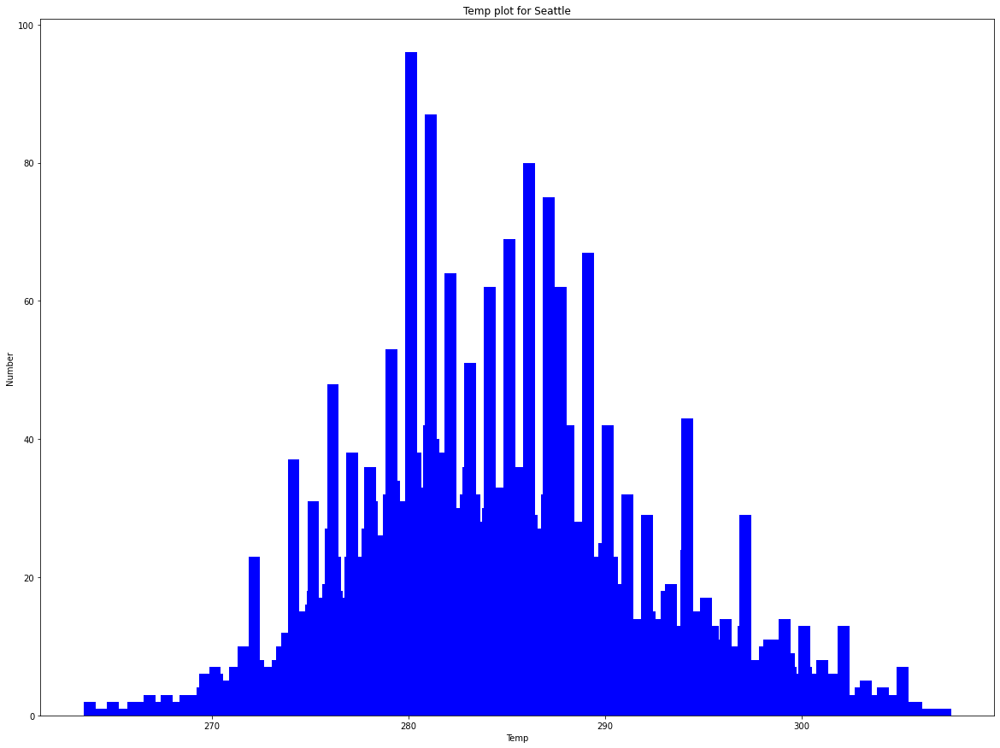

In [342]:
# Plot to check the which Seattle temperature 
x_axis=[]
y_axis=[]
for num_data,Seattle in  conn.execute('''select count(1),Seattle from weat_cvsj group by Seattle'''):
    x_axis.append(Seattle)
    y_axis.append(num_data)

fig = plt.figure(figsize = (20, 15)) 
# creating the bar plot
plt.bar(x_axis, y_axis, color ='Blue',width = 0.6)  
plt.xlabel('Temp')
plt.ylabel('Number')
plt.title('Temp plot for Seattle')

Text(0.5, 1.0, 'Temp vs Date for Seattle')

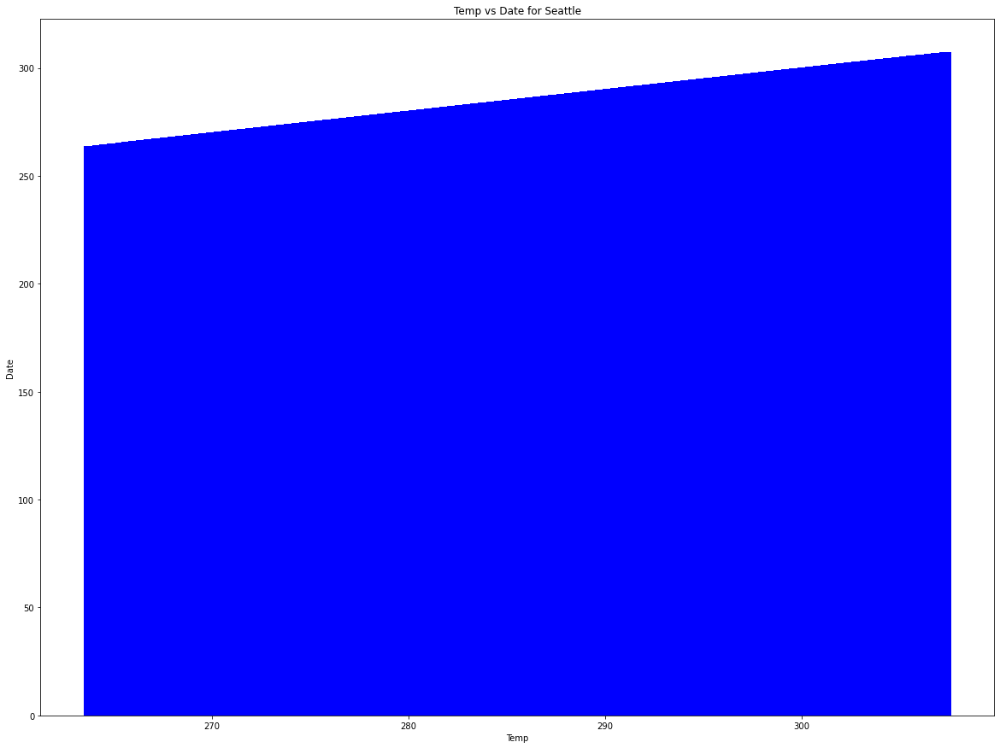

In [341]:
# Plot to check the which days are seeing for heightest temperature in Seattle
x_axis=[]
y_axis=[]
for mtemp,date_time in  conn.execute('''select max(Seattle),Seattle from weat_cvsj group by Seattle'''):
    x_axis.append(mtemp)
    y_axis.append(date_time)

fig = plt.figure(figsize = (20, 15)) 
# creating the bar plot
plt.bar(x_axis, y_axis, color ='Blue',width = 0.6)
plt.xlabel('Temp')
plt.ylabel('Date')
plt.title('Temp vs Date for Seattle')

TypeError: Cannot cast array data from dtype('float64') to dtype('<U32') according to the rule 'safe'

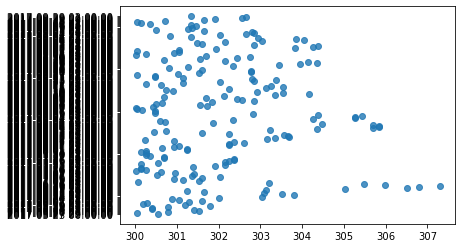

In [339]:
# scatter Plot to check distribution of seattle weather
x_axis=[]
y_axis=[]
for Seattle,d in  conn.execute("select Seattle, date_time FROM weat_cvsj where Seattle >300 and date_time > '2016-10-27 23:00:00'"):
    x_axis.append(Seattle)
    y_axis.append(d)

sns.regplot(x=x_axis, y=y_axis)

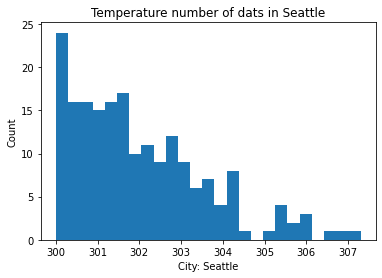

In [346]:
#Histogram for the Seattle weather

x_axis=[]
y_axis=[]
for Seattle,Phoenix in  conn.execute("select Seattle, Phoenix FROM weat_cvsj where Seattle >300 and date_time > '2016-10-27 23:00:00'"):
    x_axis.append(Seattle)
    y_axis.append(Phoenix)


plt.hist(x_axis, bins = 25)
plt.xlabel('City: Seattle')
plt.ylabel('Count')
plt.title('Temperature number of days in Seattle')
plt.show()

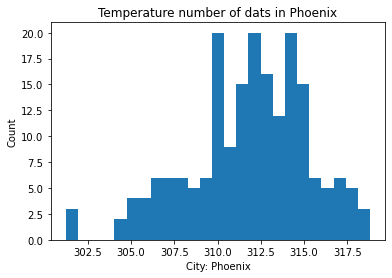

In [347]:
#Histogram for the phoenix weather

x_axis=[]
y_axis=[]
for Seattle,Phoenix in  conn.execute("select Seattle, Phoenix FROM weat_cvsj where Seattle >300 and date_time > '2016-10-27 23:00:00'"):
    x_axis.append(Phoenix)
    y_axis.append(Phoenix)


plt.hist(x_axis, bins = 25)
plt.xlabel('City: Phoenix')
plt.ylabel('Count')
plt.title('Temperature number of days in Phoenix')
plt.show()

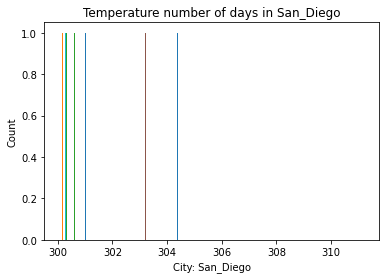

In [358]:
# Histogram for Snadiego weather
x_axis=[]
y_axis=[]
for San_Diego in  conn.execute("select San_Diego FROM weat_cvsj where San_Diego >300 and date_time > '2016-10-27 23:00:00'"):
    x_axis.append(San_Diego)
    y_axis.append(San_Diego)


plt.hist(x_axis, bins = 25)
plt.xlabel('City: San_Diego')
plt.ylabel('Count')
plt.title('Temperature number of days in San_Diego')
plt.show()

250-500-word summary of what you learned and had to do to complete the project.

As a part of this class project final project, I have considered three datasets regarding Weather details(temperature, pressure) based on the different cities in USA. The three datasets are linked based on the CITY, STATE of a given LOCATION.  

1.	Data source as a flat file - A Data from the source, is taken that contains multiple CVS files  that contains attributes of city names, temperature, pressure, humidity details for the past. 
Data Source details: 
1.	CSV data source, Kaggle; https://www.kaggle.com/datasets/selfishgene/historical-hourly-weather-data

In the Data source, there are multiple CSV files with names : 
a.	City attributes – With details of city names
b.	Temperature – With Temperature details for that city.
c.	Pressure – With Pressure details for that city.
d.	Humidity- With Humidity details for the city.
e.	Wind – With wind details for that city.
 
2.	API Data Source : Data Pull from API, Openweather
a.	API download:  https://openweathermap.org/api
In this Data source from the API, if we pass a ZIP code or City Name and State  , all the weather attributes are displayed for that city. The attributes like : City Name, State, current  temperature , High and Low temperature for that date , Pressure , Wind for the given date.
3.	Web Site data : Website Data, factiva.com
http://www.factiva.com/CP_Developer/ProductHelp/FDK/FDK20/registration/shared_code_tables/state_province_table/united_states_state_province_table.htm

This Website writes the all US state names and codes.  This can be used to join the other 2 data sources by state and city.
2.	Milestone : 2, 3, 4: 
a.	As a  part of these mile stones, the data cleansing is done from each of the sources. The following tasks are performed from each of the source.
b.	From Flat file :
i.	Data is read from the csv file.
ii.	Loaded into  data frame
iii.	Headers are updated with the required names.
iv.	Validated the data for blank values and removed them.
v.	Identified the unnecessary columns and deleted from the data frame.
vi.	Corrected the values if required in each column of the data.
c.	From Website : 
i.	Loaded the data from website to the Data Frame.
ii.	Validated if all the required attributes are present in the data.
iii.	Updated the Column headers with the required names.
iv.	Deleted/corrected the unnecessary data.
d.	From API : 	
i.	Identified the weather api and understood how it is working.
ii.	Validated the data that was written from weather API. There are multiple attributes for a given city or zip code.
iii.	Converted the returned data into JSON format for ease of access.
iv.	Identified the required weather attributes from the data  written from the API.
v.	Loaded the data into a data frame. Updated the headers with the required names.
vi.	Validated the attributes for the few examples of weather attributes for zip codes and cities.
vii.	 Exposed the data set to pandas_profiling to identify the correlation between variables missing values and outliers in the dataset.
3.	Milestone 5: I have loaded individual data from flat file, website, API data frames to separate tables using SQLite. I have encountered few issues along with way with data extraction from website and API but figured out in the end and loaded the final set of data to the API table. Created few visualizations and mainly focused on Temperature Attribute of the Weather attribute. 







Data Source References:

Data Source 1: CSV data source, Kaggle
https://www.kaggle.com/datasets/selfishgene/historical-hourly-weather-data

Data Source 2: Data Pull from API, Openweather
API download:  https://openweathermap.org/api 

Data Source 3: Website Data, factiva.com
http://www.factiva.com/CP_Developer/ProductHelp/FDK/FDK20/registration/shared_code_tables/state_province_table/united_states_state_province_table.htm


Final Word : Out of all the coursed completed till now, 540 is excellant in terms of learning Python and Data science.

Thank you Somuch Professor Catherine Willams.
